#Importing Libraries

# Required Folders From Kaggle Dataset

In [ ]:
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"nabeelalmaqramy","key":"1a4a0d18fc74b053888d7795a41548e5"}'}

In [2]:
import os
import zipfile

os.makedirs('/root/.kaggle', exist_ok=True)
!mv kaggle.json /root/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000

In [3]:
!kaggle datasets download -d ismailpromus/skin-diseases-image-dataset

Dataset URL: https://www.kaggle.com/datasets/ismailpromus/skin-diseases-image-dataset
License(s): copyright-authors
100% 5.17G/5.19G [01:25<00:01, 20.4MB/s]
100% 5.19G/5.19G [01:25<00:00, 65.4MB/s]


In [ ]:
!unzip skin-cancer-mnist-ham10000.zip -d /content/dataset1/

unzip:  cannot find or open skin-cancer-mnist-ham10000.zip, skin-cancer-mnist-ham10000.zip.zip or skin-cancer-mnist-ham10000.zip.ZIP.


In [4]:
!unzip skin-diseases-image-dataset.zip -d /content/dataset/

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/IMG_CLASSES/7. Psoriasis pictures Lichen Planus and related diseases - 2k/t-Lichen-Sclerosus-Skin-65.jpg  
  inflating: /content/dataset/IMG_CLASSES/7. Psoriasis pictures Lichen Planus and related diseases - 2k/t-Lichen-Sclerosus-Skin-66.jpg  
  inflating: /content/dataset/IMG_CLASSES/7. Psoriasis pictures Lichen Planus and related diseases - 2k/t-Lichen-Sclerosus-Skin-67.jpg  
  inflating: /content/dataset/IMG_CLASSES/7. Psoriasis pictures Lichen Planus and related diseases - 2k/t-Lichen-Sclerosus-Skin-69.jpg  
  inflating: /content/dataset/IMG_CLASSES/7. Psoriasis pictures Lichen Planus and related diseases - 2k/t-Lichen-Sclerosus-Skin-7.jpg  
  inflating: /content/dataset/IMG_CLASSES/7. Psoriasis pictures Lichen Planus and related diseases - 2k/t-Lichen-Sclerosus-Skin-70.jpg  
  inflating: /content/dataset/IMG_CLASSES/7. Psoriasis pictures Lichen Planus and related diseases - 2k/t-Lichen-Sclerosus-Skin-

In [5]:
import os
import shutil

# Define the dataset path
dataset_path = "/content/dataset/IMG_CLASSES"

# List all folders in the directory
folders = os.listdir(dataset_path)

# Keep only these folders
folders_to_keep = ["2. Melanoma 15.75k", "4. Basal Cell Carcinoma (BCC) 3323", "5. Melanocytic Nevi (NV) - 7970"]

# Delete all other folders
for folder in folders:
    if not any(folder.startswith(keep) for keep in folders_to_keep):
        folder_path = os.path.join(dataset_path, folder)
        shutil.rmtree(folder_path)  # Delete the folder
        print(f"Deleted: {folder}")


Deleted: 8. Seborrheic Keratoses and other Benign Tumors - 1.8k
Deleted: 9. Tinea Ringworm Candidiasis and other Fungal Infections - 1.7k
Deleted: 7. Psoriasis pictures Lichen Planus and related diseases - 2k
Deleted: 6. Benign Keratosis-like Lesions (BKL) 2624
Deleted: 1. Eczema 1677
Deleted: 10. Warts Molluscum and other Viral Infections - 2103
Deleted: 3. Atopic Dermatitis - 1.25k


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import shutil
import glob
from google.colab import drive
import random
import math
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras import layers, models, optimizers, callbacks
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications import EfficientNetV2M ,EfficientNetV2S
from tensorflow.keras.utils import register_keras_serializable
from tensorflow.keras import mixed_precision

mixed_precision.set_global_policy('mixed_float16')

IMG_SIZE = 380  
BATCH_SIZE = 32 
EPOCHS = 50    
SEED = 42
TEST_SIZE = 0.2 
WARMUP_EPOCHS = 10 
DATASET_PATH = "/content/dataset/IMG_CLASSES"
DATASET_Test_PATH = "/content/dataset1/Skin cancer ISIC The International Skin Imaging Collaboration/Test"

IMG_CLASSES = {"BCC": 0, "MEL": 1, "NV": 2}


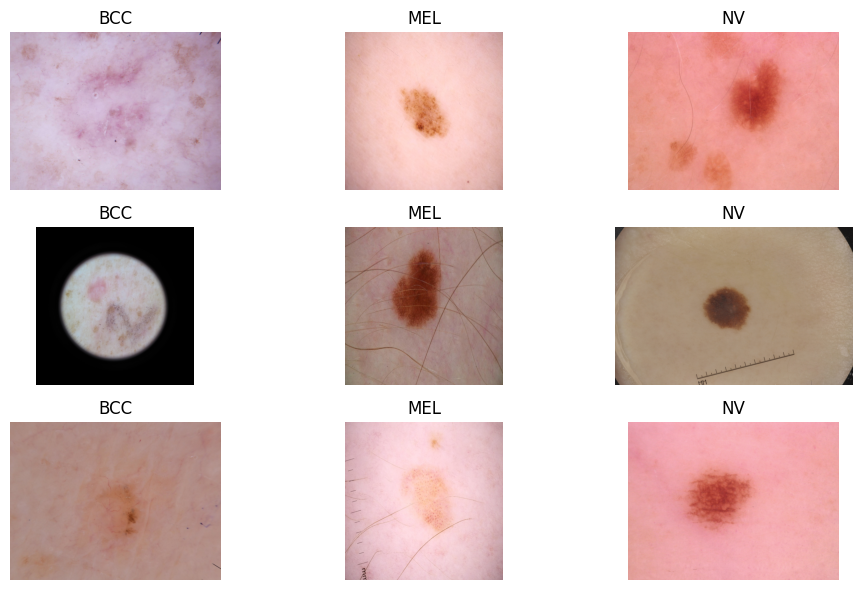

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from matplotlib.image import imread

images_per_class = 3

plt.figure(figsize=(10, 6))

for i, class_name in enumerate(IMG_CLASSES):
    class_dir = os.path.join(DATASET_PATH, class_name)
    images = os.listdir(class_dir)
    selected_images = random.sample(images, images_per_class)

    for j, img_name in enumerate(selected_images):
        img_path = os.path.join(class_dir, img_name)
        img = imread(img_path)

        plt.subplot(images_per_class, len(classes), j * len(classes) + i + 1)
        plt.imshow(img)
        plt.title(f"{class_name}")
        plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import os

CLASS_NAMES = {
    "4. Basal Cell Carcinoma (BCC) 3323": "BCC",
    "2. Melanoma 15.75k": "MEL",
    "5. Melanocytic Nevi (NV) - 7970": "NV"
}

def rename_folders():
    for old_name, new_name in CLASS_NAMES.items():
        old_path = os.path.join(DATASET_PATH, old_name)  
        new_path = os.path.join(DATASET_PATH, new_name)  

        if os.path.exists(old_path):
            os.rename(old_path, new_path)
            print(f"✅ تم إعادة تسمية {old_name} إلى {new_name}")
        else:
            print(f"⚠️ المجلد {old_name} غير موجود، تخطي العملية.")

rename_folders()


✅ تم إعادة تسمية 4. Basal Cell Carcinoma (BCC) 3323 إلى BCC
✅ تم إعادة تسمية 2. Melanoma 15.75k إلى MEL
✅ تم إعادة تسمية 5. Melanocytic Nevi (NV) - 7970 إلى NV


In [ ]:
import os

CLASS_NAMES = {
    "basal cell carcinoma": "BCC",
    "melanoma": "MEL",
    "nevus": "NV"
}

DATASET_PATH = "/content/dataset1/Skin cancer ISIC The International Skin Imaging Collaboration/Test"

def rename_folders():
    for old_name, new_name in CLASS_NAMES.items():
        old_path = os.path.join(DATASET_PATH, old_name) 
        new_path = os.path.join(DATASET_PATH, new_name) 

        if os.path.exists(old_path):
            os.rename(old_path, new_path)
            print(f"✅ تم إعادة تسمية {old_name} إلى {new_name}")
        else:
            print(f"⚠️ المجلد {old_name} غير موجود، تخطي العملية.")

rename_folders()


⚠️ المجلد basal cell carcinoma غير موجود، تخطي العملية.
⚠️ المجلد melanoma غير موجود، تخطي العملية.
⚠️ المجلد nevus غير موجود، تخطي العملية.


# UnderSampler

In [ ]:
source_folder = "dataset/IMG_CLASSES/NV/"
ignore_folder = "dataset/IMG_CLASSES/ignore/"

os.makedirs(ignore_folder, exist_ok=True)

image_files = os.listdir(source_folder)

if len(image_files) < 3000:
    print("❌ عدد الصور أقل من 3000، لا يمكن النقل.")
else:
    
    images_to_move = random.sample(image_files, 3000)

    for img in images_to_move:
        src_path = os.path.join(source_folder, img)
        dest_path = os.path.join(ignore_folder, img)
        shutil.move(src_path, dest_path)

    print("✅ تم نقل 4600 صورة إلى مجلد 'ignore' بنجاح!")

✅ تم نقل 4600 صورة إلى مجلد 'ignore' بنجاح!


In [ ]:
import os

def count_images_in_dir(directory):
  
    image_extensions = ('.jpg', '.jpeg', '.png')
    files = [f for f in os.listdir(directory)
             if os.path.isfile(os.path.join(directory, f)) and f.lower().endswith(image_extensions)]
    return len(files)

def print_tree(directory, indent=0):
    
    folder_name = os.path.basename(directory.rstrip(os.sep))
    if folder_name == "":
        folder_name = directory  

    count = count_images_in_dir(directory)

    print(" " * indent + f"{folder_name}: {count} صورة")

    for item in sorted(os.listdir(directory)):
        full_path = os.path.join(directory, item)
        if os.path.isdir(full_path):
            print_tree(full_path, indent + 4)

DATASET_PATH = "dataset/IMG_CLASSES/"

print("📊 **هيكل الصور وعددها حسب المجلدات:**")
print_tree(DATASET_PATH)


📊 **هيكل الصور وعددها حسب المجلدات:**
IMG_CLASSES: 0 صورة
    BCC: 3323 صورة
    MEL: 3140 صورة
    NV: 4970 صورة
    ignore: 3000 صورة


## Data Preprocessing

In [ ]:
class MedicalPreprocessor:
    def __init__(self):
        self.clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        self.kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

    def _remove_artifacts(self, image):
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        artifacts = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, self.kernel)
        _, mask = cv2.threshold(artifacts, 5, 255, cv2.THRESH_BINARY)
        kernel = np.ones((3,3), np.uint8)# add
        mask = cv2.dilate(mask, kernel, iterations=1)#add
        # return cv2.inpaint(image, mask, 3, cv2.INPAINT_TELEA)
        return cv2.inpaint(image, mask, 3, cv2.INPAINT_NS)

    def _enhance_lesion(self, image):
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        l = self.clahe.apply(l)
        return cv2.cvtColor(cv2.merge((l, a, b)), cv2.COLOR_LAB2BGR)


    def preprocess(self, image_path):
        try:
            image = cv2.imread(image_path)
            if image is None:
                print(f"⚠️ تحذير: صورة تالفة {image_path}")
                return None
            image = self._remove_artifacts(image)
            image = self._enhance_lesion(image)
            # return cv2.resize(image, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
            return cv2.resize(image, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_CUBIC)  
        except Exception as e:
            print(f"❌ خطأ في معالجة {image_path}: {str(e)}")
            return None

In [ ]:


def preprocess_images():
    processor = MedicalPreprocessor()
    for class_name in IMG_CLASSES:
        class_dir = os.path.join(DATASET_PATH, class_name)
        processed_dir = os.path.join(class_dir, "Processed")
        os.makedirs(processed_dir, exist_ok=True)

        for image_name in tqdm(os.listdir(class_dir), desc=f"Processing {class_name}"):
            if image_name.endswith(('.jpg', '.png')):
                src_path = os.path.join(class_dir, image_name)
                dst_path = os.path.join(processed_dir, image_name)
                processed_img = processor.preprocess(src_path)
                if processed_img is not None:
                  cv2.imwrite(dst_path, processed_img)
                  #  cv2.imwrite(dst_path, cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))


preprocess_images()
print("\n✅ تم إكمال المعالجة!")

Processing NV: 100%|██████████| 4971/4971 [09:02<00:00,  9.16it/s]


✅ تم إكمال المعالجة!


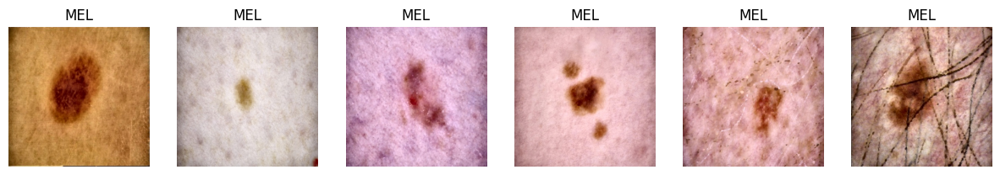

In [ ]:
import matplotlib.pyplot as plt

def show_processed_images(class_name, num_samples=6):
    processor = MedicalPreprocessor()
    class_dir = os.path.join(DATASET_PATH, class_name)
    processed_dir = os.path.join(class_dir, "processed")

    plt.figure(figsize=(15, 10))
    for i, image_name in enumerate(os.listdir(processed_dir)[:num_samples]):
        img = cv2.imread(os.path.join(processed_dir, image_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, num_samples, i+1)
        plt.imshow(img)
        plt.title(f"{class_name}")
        plt.axis("off")
    plt.show()

show_processed_images("MEL")  

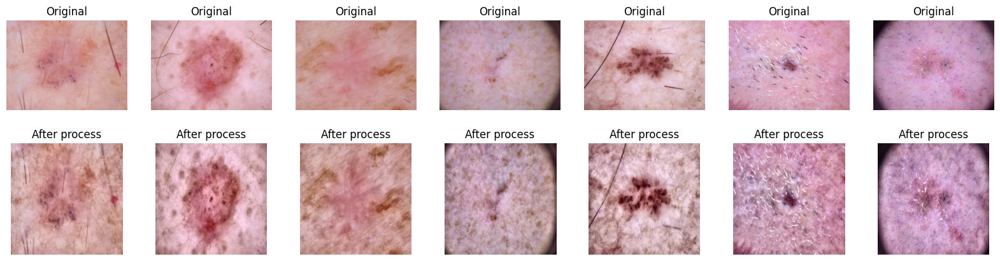

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os


class_folder = "BCC" 
image_folder = f"dataset/IMG_CLASSES/{class_folder}/"
processed_folder = f"dataset/IMG_CLASSES/{class_folder}/images_processed"

original_images = sorted(os.listdir(image_folder))[:5]  
processed_images = sorted(os.listdir(processed_folder))[:5]

plt.figure(figsize=(10, 5))
for i, img_name in enumerate(original_images):
    orig_path = os.path.join(image_folder, img_name)
    proc_path = os.path.join(processed_folder, img_name)

    if not os.path.exists(proc_path):
        continue  

    orig_img = cv2.imread(orig_path)
    proc_img = cv2.imread(proc_path)

    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    proc_img = cv2.cvtColor(proc_img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 5, i + 1)
    plt.imshow(orig_img)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(2, 5, i + 6)
    plt.imshow(proc_img)
    plt.title("After process")
    plt.axis("off")

plt.show()


In [ ]:
from google.colab import drive
from tqdm import tqdm 

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
LOCAL_DATASET_PATH = "/content/dataset/IMG_CLASSES"  
BASE_PATH = "/content/drive/MyDrive/dataset/IMG_CLASSES" 

def copy_processed_images():
    for class_name in ["BCC", "MEL", "NV"]:
        local_processed_folder = os.path.join(LOCAL_DATASET_PATH, class_name, "processed") 
        drive_processed_folder = os.path.join(BASE_PATH, class_name, "processed") 

        os.makedirs(drive_processed_folder, exist_ok=True)

        image_paths = []
        for ext in ["*.jpg", "*.jpeg", "*.png"]:
            image_paths.extend(glob.glob(os.path.join(local_processed_folder, ext)))

        print(f"📤 جاري نسخ {len(image_paths)} صورة من {class_name} إلى Google Drive...")

        for img_path in tqdm(image_paths, desc=f"📤 {class_name}", unit=" ملف"):
            img_name = os.path.basename(img_path)  
            save_path = os.path.join(drive_processed_folder, img_name)  
            
            shutil.copy(img_path, save_path)

        print(f"✅ تم نسخ جميع الصور من {class_name} إلى Google Drive.\n")

copy_processed_images()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
📤 جاري نسخ 3323 صورة من BCC إلى Google Drive...


📤 BCC: 100%|██████████| 3323/3323 [00:28<00:00, 117.85 ملف/s]


✅ تم نسخ جميع الصور من BCC إلى Google Drive.

📤 جاري نسخ 3139 صورة من MEL إلى Google Drive...


📤 MEL: 100%|██████████| 3139/3139 [00:29<00:00, 107.22 ملف/s]


✅ تم نسخ جميع الصور من MEL إلى Google Drive.

📤 جاري نسخ 3470 صورة من NV إلى Google Drive...


📤 NV: 100%|██████████| 3470/3470 [00:31<00:00, 108.85 ملف/s]

✅ تم نسخ جميع الصور من NV إلى Google Drive.



## Data Preparation - Loading Images and Labels

In [ ]:
# from google drive

BASE_PATH = "/content/drive/MyDrive/dataset/IMG_CLASSES"  
LOCAL_DATASET_PATH = "/content/dataset/IMG_CLASSES"  

def copy_images_from_drive():
    for class_name in ["BCC", "MEL", "NV"]:
        drive_processed_folder = os.path.join(BASE_PATH, class_name, "processed")  
        local_processed_folder = os.path.join(LOCAL_DATASET_PATH, class_name, "processed")  

        os.makedirs(local_processed_folder, exist_ok=True)

        image_paths = []
        for ext in ["*.jpg", "*.jpeg", "*.png"]:
            image_paths.extend(glob.glob(os.path.join(drive_processed_folder, ext)))

        print(f"📥 جاري نسخ {len(image_paths)} صورة من Google Drive إلى المجلد المحلي {class_name}...")

        for img_path in tqdm(image_paths, desc=f"📤 {class_name}"):
            img_name = os.path.basename(img_path) 
            save_path = os.path.join(local_processed_folder, img_name)  

            shutil.copy(img_path, save_path)

        print(f"✅ تم نسخ جميع الصور من {class_name} إلى Colab.\n")

copy_images_from_drive()


Mounted at /content/drive
📥 جاري نسخ 3323 صورة من Google Drive إلى المجلد المحلي BCC...


📤 BCC: 100%|██████████| 3323/3323 [01:34<00:00, 35.17it/s] 


✅ تم نسخ جميع الصور من BCC إلى Colab.

📥 جاري نسخ 3137 صورة من Google Drive إلى المجلد المحلي MEL...


📤 MEL: 100%|██████████| 3137/3137 [01:39<00:00, 31.63it/s] 


✅ تم نسخ جميع الصور من MEL إلى Colab.

📥 جاري نسخ 3470 صورة من Google Drive إلى المجلد المحلي NV...


📤 NV: 100%|██████████| 3470/3470 [01:54<00:00, 30.27it/s] 

✅ تم نسخ جميع الصور من NV إلى Colab.



## 6. prepare training step

In [ ]:

def load_data():
    image_paths = []
    labels = []
    for class_name, label in IMG_CLASSES.items():
        # class_dir = os.path.join(DATASET_PATH, class_name)
        class_dir = os.path.join(DATASET_PATH, class_name,"processed")
        files = [os.path.join(class_dir, f) for f in os.listdir(class_dir)
                 if f.endswith(('.jpg', '.png'))]
        image_paths.extend(files)
        labels.extend([label] * len(files))

   
    valid_labels = set(IMG_CLASSES.values())
    assert all(lbl in valid_labels for lbl in labels), 

    return train_test_split(image_paths, labels, test_size=0.2,
                           stratify=labels, random_state=SEED)

X_train, X_test, y_train, y_test = load_data()

unique_classes = np.unique(y_train)
class_weights = compute_class_weight('balanced', classes=unique_classes, y=y_train)
class_weight_dict = dict(zip(unique_classes, class_weights))

print("Class Weights:", class_weight_dict)  
print("Training classes:", np.unique(y_train, return_counts=True))
print("Validation classes:", np.unique(y_test, return_counts=True))

Class Weights: {np.int64(0): np.float64(1.1469776774517182), np.int64(1): np.float64(1.2136411889596603), np.int64(2): np.float64(0.7667672702883971)}
Training classes: (array([0, 1, 2]), array([2658, 2512, 3976]))
Validation classes: (array([0, 1, 2]), array([665, 628, 994]))


In [ ]:
print("Training distribution:")
for cls, count in zip(IMG_CLASSES.keys(), np.unique(y_train, return_counts=True)[1]):
    print(f"{cls}: {count} ({count/len(y_train)*100:.2f}%)")

print("\nValidation distribution:")
for cls, count in zip(IMG_CLASSES.keys(), np.unique(y_test, return_counts=True)[1]):
    print(f"{cls}: {count} ({count/len(y_test)*100:.2f}%)")

Training distribution:
BCC: 411 (6.17%)
MEL: 890 (13.35%)
NV: 5364 (80.48%)

Validation distribution:
BCC: 103 (6.18%)
MEL: 223 (13.38%)
NV: 1341 (80.44%)


# pipline

In [ ]:
from tensorflow.keras import layers

data_augmenter = tf.keras.Sequential([
    # layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.25),  # زيادة الشدة
    layers.RandomZoom(0.2, 0.2),
    layers.RandomContrast(0.2),
    # layers.RandomBrightness(0.005),
    # layers.GaussianNoise(0.01),
], name="augmenter")


def mixup_batch(images, labels, alpha=0.15):
    beta = tfp.distributions.Beta(alpha, alpha).sample([tf.shape(images)[0]])
    beta = tf.cast(beta, tf.float32)
    beta = tf.reshape(beta, (-1, 1, 1, 1)) 
    beta_label = tf.reshape(beta, (-1, 1)) 

    indices = tf.range(tf.shape(images)[0])
    shuffled_indices = tf.random.shuffle(indices)

    x1, x2 = images, tf.gather(images, shuffled_indices)
    y1, y2 = labels, tf.gather(labels, shuffled_indices)

    mixed_images = beta * x1 + (1.0 - beta) * x2
    mixed_labels = beta_label * y1 + (1.0 - beta_label) * y2

    return mixed_images, mixed_labels

def build_dataset(paths, labels, shuffle=True, mixup=False):
    def load_image(path, label):
        image = tf.io.read_file(path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0
        label = tf.one_hot(label, depth=3)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(paths), seed=SEED)

    dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)

    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)

    if mixup:
        dataset = dataset.map(lambda x, y: mixup_batch(x, y), num_parallel_calls=tf.data.AUTOTUNE)

    return dataset.prefetch(tf.data.AUTOTUNE)

train_ds = build_dataset(X_train, y_train, shuffle=True, mixup=False)
test_ds = build_dataset(X_test, y_test, shuffle=False, mixup=False)

In [ ]:
# without mixup

def build_dataset(paths, labels, shuffle=True):
    def load_image(path, label):
        image = tf.io.read_file(path)
        image = tf.image.decode_jpeg(image, channels=3)
        # image = image[..., ::-1]  # ← إضافة هذا السطر لتحويل BGR → RGB
        image = tf.cast(image, tf.float32) / 255.0
        image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
        # image = tf.image.per_image_standardization(image)  # ← تطبيع متوافق مع CLAHE
        label = tf.one_hot(label, depth=3)  # ✅ تحويل لـ one-hot
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    if shuffle:
        dataset = dataset.shuffle(buffer_size=int(len(paths)*0.3), seed=SEED)

    dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

train_ds = build_dataset(X_train, y_train)
test_ds = build_dataset(X_test, y_test, shuffle=False)

# build model

In [ ]:

data_augmenter = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.25),  # زيادة الشدة
    layers.RandomZoom(0.17, 0.17),
    layers.RandomContrast(0.17),
    # layers.RandomBrightness(0.1),
    # layers.GaussianNoise(0.03),
], name="augmenter")


class MulticlassAUC(tf.keras.metrics.AUC):
    def __init__(self, num_classes, **kwargs):
        super().__init__(multi_label=True, num_labels=num_classes, **kwargs)  # ← إضافة multi_label=True
        self.num_classes = num_classes

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.ensure_shape(y_true, (None, self.num_classes))
        y_pred = tf.ensure_shape(y_pred, (None, self.num_classes))
        super().update_state(y_true, y_pred, sample_weight)

@tf.keras.utils.register_keras_serializable()
def focal_loss(gamma=2.0, alpha=None):
    def loss(y_true, y_pred):
        epsilon = tf.keras.backend.epsilon()
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)

        cross_entropy = -tf.reduce_sum(y_true * tf.math.log(y_pred), axis=-1)

        if alpha is not None:
            alpha_factor = tf.reduce_sum(tf.convert_to_tensor(alpha, dtype=tf.float32) * y_true, axis=-1)
        else:
            alpha_factor = 1.0

        focal_loss_value = alpha_factor * tf.pow(1 - tf.reduce_sum(y_pred * y_true, axis=-1), gamma) * cross_entropy
        return tf.reduce_mean(focal_loss_value)

    return loss

def eca_block(input_feature, b=1, gamma=2):
    channel = input_feature.shape[-1]
    # حساب حجم النافذة بشكل ديناميكي
    kernel_size = int(abs((math.log(channel, 2) + b) / gamma))

    x = layers.GlobalAveragePooling2D()(input_feature)  
    x = layers.Reshape((1, 1, channel))(x)
    x = layers.Conv2D(
        filters=1, 
        kernel_size=(1, kernel_size), 
        padding='same',
        use_bias=False
    )(x)

    x = layers.Activation('sigmoid')(x)  
    return layers.multiply([input_feature, x])  

# # إضافة طبقة Squeeze-and-Excitation للانتباه
# def se_block(input_feature, ratio=6):
#     channel = input_feature.shape[-1]
#     x = layers.GlobalAveragePooling2D()(input_feature)
#     x = layers.Dense(channel // ratio, activation='relu')(x)
#     x = layers.Dense(channel, activation='sigmoid')(x)
#     return layers.multiply([input_feature, x])

def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))

In [ ]:

def build_model(fine_tune=False, epochs= 50):
    base_model = EfficientNetV2S(weights='imagenet', include_top=False, input_shape=(380, 380, 3))

    for layer in base_model.layers:
        layer.trainable = False

    if not fine_tune:
        base_model.trainable = False
    else:
        freeze_ratio = 0.4
        freeze_until = int(len(base_model.layers) * freeze_ratio)
        for layer in base_model.layers[freeze_until:]:
            layer.trainable = True

    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = data_augmenter(inputs)

    x = base_model(x)
    # x = se_block(x)
    x = eca_block(x) 
    # Improved attention blocks
    x = layers.Conv2D(256, 1, activation='swish')(x)
    x = layers.GlobalAveragePooling2D()(x)

    # Classification head
    x = layers.Dense(256, activation='swish', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    # x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Dense(128, activation='swish', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    # x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)

    # x = layers.Dense(64, activation=mish)(x) 
    # x = layers.BatchNormalization()(x)
    # x = layers.Dropout(0.5)(x)

    outputs = layers.Dense(3, activation='softmax', dtype=tf.float32)(x)

    model = models.Model(inputs, outputs)

    #  One Cycle Policy  AdamW
    total_steps = epochs * len(train_ds) 
    warmup_steps = int(0.10 * total_steps)  
    decay_steps = total_steps - warmup_steps  

    lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=1e-3 if not fine_tune else 5e-5, 
        decay_steps=decay_steps,     
        alpha=1e-6,                  
        warmup_target=1e-3 if not fine_tune else 1e-5,          
        warmup_steps=warmup_steps   
    )

    optimizer = tf.keras.optimizers.AdamW(
        learning_rate=lr_schedule,
        weight_decay=1e-5
    )

    alpha_values = [class_weight_dict[i] for i in range(len(class_weight_dict))]
    model.compile(
        optimizer=optimizer,
        # loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05),
        loss=focal_loss(gamma=1.5,alpha=alpha_values),
        metrics=[
            'accuracy',
            MulticlassAUC(num_classes=3, name='auc'),
            tf.keras.metrics.Precision(name='precision'),
            tf.keras.metrics.Recall(name='recall')
        ]
    )
    return model

model = build_model() 

model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 380, 380,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cast_13 (Cast)      │ (None, 380, 380,  │          0 │ input_layer_10[0… │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ augmenter           │ (None, 380, 380,  │          0 │ cast_13[0][0]     │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ efficientnetv2-s    │ (None, 12, 12,    │ 20,331,360 │ augmenter[4][0]   │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1280)      │          0 │ efficientnetv2-s… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_4 (Reshape) │ (None, 1, 1,      │          0 │ global_average_p… │
│                     │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 1, 1, 1)   │      6,400 │ reshape_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 1, 1, 1)   │          0 │ conv2d_8[0][0]    │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_4          │ (None, 12, 12,    │          0 │ efficientnetv2-s… │
│ (Multiply)          │ 1280)             │            │ activation_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 12, 12,    │    327,936 │ multiply_4[0][0]  │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 256)       │          0 │ conv2d_9[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_12 (Dense)    │ (None, 256)       │     65,792 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 256)       │          0 │ dense_12[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_13 (Dense)    │ (None, 128)       │     32,896 │ dropout_8[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 128)       │          0 │ dense_13[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cast_14 (Cast)      │ (None, 128)       │          0 │ dropout_9[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_14 (Dense)    │ (None, 3)         │        387 │ cast_14[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 20,764,771 (79.21 MB)

 Trainable params: 433,411 (1.65 MB)

 Non-trainable params: 20,331,360 (77.56 MB)

# Callbacks

In [ ]:
callbacks_list = [
    callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, mode='max'),
    callbacks.ModelCheckpoint('/content/drive/MyDrive/best_model_v8.keras', save_best_only=True, monitor='val_auc',mode='max'),
    callbacks.TensorBoard(log_dir='/content/drive/MyDrive/logs')  
]

# start training

In [11]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/logs

<IPython.core.display.Javascript object>

In [ ]:
#First phase
model = build_model(fine_tune=False, epochs=10)
history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=10, 
    class_weight=class_weight_dict,
    callbacks=callbacks_list
)

Epoch 1/10
285/285 ━━━━━━━━━━━━━━━━━━━━ 214s 362ms/step - accuracy: 0.3293 - auc: 0.5246 - loss: 4.9659 - precision: 0.3394 - recall: 0.1569 - val_accuracy: 0.2742 - val_auc: 0.6434 - val_loss: 4.3210 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/10
285/285 ━━━━━━━━━━━━━━━━━━━━ 59s 205ms/step - accuracy: 0.3495 - auc: 0.5489 - loss: 4.3049 - precision: 0.3809 - recall: 0.1450 - val_accuracy: 0.2901 - val_auc: 0.6748 - val_loss: 3.8388 - val_precision: 0.9145 - val_recall: 0.0471
Epoch 3/10
285/285 ━━━━━━━━━━━━━━━━━━━━ 79s 194ms/step - accuracy: 0.3612 - auc: 0.5662 - loss: 3.7973 - precision: 0.3819 - recall: 0.1449 - val_accuracy: 0.2918 - val_auc: 0.6625 - val_loss: 3.6513 - val_precision: 0.3527 - val_recall: 0.2645
Epoch 4/10
285/285 ━━━━━━━━━━━━━━━━━━━━ 61s 214ms/step - accuracy: 0.3805 - auc: 0.5867 - loss: 3.3931 - precision: 0.4245 - recall: 0.1489 - val_accuracy: 0.3675 - val_auc: 0.6931 - val_loss: 3.1138 - val_precision: 0.5520 - val_recall: 0.1730
Epoch 5/10


In [ ]:
# second phase
model = build_model(fine_tune=True, epochs=50)

model.load_weights('/content/drive/MyDrive/best_model_v3.keras')  

history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=callbacks_list,
    initial_epoch=10 
)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'loss_scale_optimizer', because it has 3 variables whereas the saved optimizer has 45 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adamw', because it has 1 variables whereas the saved optimizer has 41 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 11/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 403s 553ms/step - accuracy: 0.3696 - auc: 0.5827 - loss: 2.5767 - precision: 0.4181 - recall: 0.1477 - val_accuracy: 0.4419 - val_auc: 0.7394 - val_loss: 2.2758 - val_precision: 0.5921 - val_recall: 0.2165
Epoch 12/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 206s 550ms/step - accuracy: 0.4256 - auc: 0.6583 - loss: 2.3389 - precision: 0.5074 - recall: 0.2396 - val_accuracy: 0.4591 - val_auc: 0.7550 - val_loss: 2.1627 - val_precision: 0.6397 - val_recall: 0.2650
Epoch 13/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 178s 627ms/step - accuracy: 0.4498 - auc: 0.6813 - loss: 2.2186 - precision: 0.5488 - recall: 0.2559 - val_accuracy: 0.4749 - val_auc: 0.7657 - val_loss: 2.0762 - val_precision: 0.6083 - val_recall: 0.2892
Epoch 14/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 178s 625ms/step - accuracy: 0.4756 - auc: 0.7155 - loss: 2.1125 - precision: 0.5782 - recall: 0.2742 - val_accuracy: 0.4965 - val_auc: 0.7844 - val_loss: 1.9908 - val_precision: 0.7023 - val_recall: 0.2544
Epoch 15/50


In [ ]:
model.save('/content/drive/MyDrive/skin_canser_model.h5')

In [ ]:
model = build_model(fine_tune=True, epochs=50)

model.load_weights('/content/drive/MyDrive/best_model_v2.keras') 
# model = tf.keras.models.load_model('/content/drive/MyDrive/best_model_v2.keras', custom_objects={'focal_loss': focal_loss})  # Use tf.keras.models.load_model to load the model

history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=callbacks_list,
    initial_epoch=10  
)
model.save('/content/drive/MyDrive/skin_canser_model.keras')

Epoch 11/50
248/248 ━━━━━━━━━━━━━━━━━━━━ 546s 1s/step - accuracy: 0.8903 - auc: 0.9700 - loss: 0.1959 - precision: 0.9275 - recall: 0.7898 - val_accuracy: 0.9556 - val_auc: 0.9963 - val_loss: 0.0921 - val_precision: 0.9631 - val_recall: 0.9481
Epoch 12/50
248/248 ━━━━━━━━━━━━━━━━━━━━ 360s 1s/step - accuracy: 0.9333 - auc: 0.9885 - loss: 0.1190 - precision: 0.9450 - recall: 0.9112 - val_accuracy: 0.9441 - val_auc: 0.9918 - val_loss: 0.1061 - val_precision: 0.9452 - val_recall: 0.9390
Epoch 13/50
248/248 ━━━━━━━━━━━━━━━━━━━━ 360s 1s/step - accuracy: 0.9449 - auc: 0.9920 - loss: 0.1051 - precision: 0.9517 - recall: 0.9347 - val_accuracy: 0.9602 - val_auc: 0.9954 - val_loss: 0.0853 - val_precision: 0.9644 - val_recall: 0.9561
Epoch 14/50
248/248 ━━━━━━━━━━━━━━━━━━━━ 365s 1s/step - accuracy: 0.9501 - auc: 0.9940 - loss: 0.0944 - precision: 0.9559 - recall: 0.9408 - val_accuracy: 0.9657 - val_auc: 0.9974 - val_loss: 0.0768 - val_precision: 0.9700 - val_recall: 0.9617
Epoch 15/50
248/248 ━━━━

In [ ]:
model.save('/content/drive/MyDrive/skin_canser_model_v2.h5')

In [ ]:
model = build_model(fine_tune=True, epochs=50)

model.load_weights('/content/drive/MyDrive/best_model_v5.keras')  # ← إعادة تحميل أفضل نموذج
# model = tf.keras.models.load_model('/content/drive/MyDrive/best_model_v2.keras', custom_objects={'focal_loss': focal_loss})  # Use tf.keras.models.load_model to load the model

history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=callbacks_list,
    initial_epoch=10  
)
model.save('/content/drive/MyDrive/skin_canser_model.keras')

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'loss_scale_optimizer', because it has 3 variables whereas the saved optimizer has 923 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adamw', because it has 1 variables whereas the saved optimizer has 919 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 11/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 622s 2s/step - accuracy: 0.9060 - auc: 0.9799 - loss: 0.1421 - precision: 0.9195 - recall: 0.8887 - val_accuracy: 0.9525 - val_auc: 0.9917 - val_loss: 0.1007 - val_precision: 0.9609 - val_recall: 0.9410
Epoch 12/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 418s 1s/step - accuracy: 0.9358 - auc: 0.9910 - loss: 0.1010 - precision: 0.9431 - recall: 0.9248 - val_accuracy: 0.9573 - val_auc: 0.9941 - val_loss: 0.0909 - val_precision: 0.9602 - val_recall: 0.9547
Epoch 13/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 419s 1s/step - accuracy: 0.9456 - auc: 0.9922 - loss: 0.0959 - precision: 0.9510 - recall: 0.9389 - val_accuracy: 0.9626 - val_auc: 0.9963 - val_loss: 0.0796 - val_precision: 0.9646 - val_recall: 0.9604
Epoch 14/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 414s 1s/step - accuracy: 0.9573 - auc: 0.9951 - loss: 0.0796 - precision: 0.9624 - recall: 0.9535 - val_accuracy: 0.9665 - val_auc: 0.9963 - val_loss: 0.0749 - val_precision: 0.9682 - val_recall: 0.9635
Epoch 15/50
285/285 ━━━━

In [ ]:
model = build_model(fine_tune=True, epochs=50)

model.load_weights('/content/drive/MyDrive/best_model_v6.keras') 
# model = tf.keras.models.load_model('/content/drive/MyDrive/best_model_v2.keras', custom_objects={'focal_loss': focal_loss})  # Use tf.keras.models.load_model to load the model

history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=callbacks_list,
    initial_epoch=21  
)
model.save('/content/drive/MyDrive/skin_canser_model.keras')

Epoch 22/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 584s 1s/step - accuracy: 0.9571 - auc: 0.9953 - loss: 0.0769 - precision: 0.9608 - recall: 0.9535 - val_accuracy: 0.9591 - val_auc: 0.9947 - val_loss: 0.0819 - val_precision: 0.9640 - val_recall: 0.9551
Epoch 23/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 420s 1s/step - accuracy: 0.9634 - auc: 0.9972 - loss: 0.0660 - precision: 0.9660 - recall: 0.9604 - val_accuracy: 0.9454 - val_auc: 0.9951 - val_loss: 0.0901 - val_precision: 0.9503 - val_recall: 0.9432
Epoch 24/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 422s 1s/step - accuracy: 0.9641 - auc: 0.9973 - loss: 0.0647 - precision: 0.9668 - recall: 0.9611 - val_accuracy: 0.9727 - val_auc: 0.9983 - val_loss: 0.0601 - val_precision: 0.9731 - val_recall: 0.9718
Epoch 25/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 414s 1s/step - accuracy: 0.9740 - auc: 0.9982 - loss: 0.0569 - precision: 0.9764 - recall: 0.9719 - val_accuracy: 0.9661 - val_auc: 0.9976 - val_loss: 0.0653 - val_precision: 0.9673 - val_recall: 0.9643
Epoch 26/50
285/285 ━━━━

KeyboardInterrupt: 

In [11]:
model = build_model(fine_tune=True, epochs=50)

model.load_weights('/content/drive/MyDrive/best_model_v6.keras')  # ← إعادة تحميل أفضل نموذج
# model = tf.keras.models.load_model('/content/drive/MyDrive/best_model_v2.keras', custom_objects={'focal_loss': focal_loss})  # Use tf.keras.models.load_model to load the model

history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=callbacks_list,
    initial_epoch=21  # ← استكمال من حيث انتهت المرحلة الأولى
 )
model.save('/content/drive/MyDrive/skin_canser_model.keras')

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'loss_scale_optimizer', because it has 3 variables whereas the saved optimizer has 923 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adamw', because it has 1 variables whereas the saved optimizer has 919 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 22/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 366s 890ms/step - accuracy: 0.9333 - auc: 0.9888 - loss: 0.1102 - precision: 0.9403 - recall: 0.9265 - val_accuracy: 0.9626 - val_auc: 0.9966 - val_loss: 0.0693 - val_precision: 0.9646 - val_recall: 0.9595
Epoch 23/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 279s 776ms/step - accuracy: 0.9543 - auc: 0.9946 - loss: 0.0828 - precision: 0.9597 - recall: 0.9466 - val_accuracy: 0.9688 - val_auc: 0.9977 - val_loss: 0.0630 - val_precision: 0.9703 - val_recall: 0.9648
Epoch 24/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 263s 779ms/step - accuracy: 0.9648 - auc: 0.9962 - loss: 0.0715 - precision: 0.9677 - recall: 0.9593 - val_accuracy: 0.9692 - val_auc: 0.9979 - val_loss: 0.0594 - val_precision: 0.9704 - val_recall: 0.9661
Epoch 25/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 241s 846ms/step - accuracy: 0.9641 - auc: 0.9966 - loss: 0.0694 - precision: 0.9680 - recall: 0.9608 - val_accuracy: 0.9745 - val_auc: 0.9987 - val_loss: 0.0543 - val_precision: 0.9766 - val_recall: 0.9727


In [ ]:
model = build_model(fine_tune=True, epochs=50)

model.load_weights('/content/drive/MyDrive/best_model_v6.keras')
# model.load_weights('/content/drive/MyDrive/best_model_v9.h5', by_name=True, skip_mismatch=True)

# model = tf.keras.models.load_model('/content/drive/MyDrive/best_model_v2.keras', custom_objects={'focal_loss': focal_loss})  # Use tf.keras.models.load_model to load the model

history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=callbacks_list,
    initial_epoch=21  # ← استكمال من حيث انتهت المرحلة الأولى
 )
model.save('/content/drive/MyDrive/skin_canser_model.keras')

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'loss_scale_optimizer', because it has 3 variables whereas the saved optimizer has 923 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adamw', because it has 1 variables whereas the saved optimizer has 919 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 22/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 329s 802ms/step - accuracy: 0.9397 - auc: 0.9900 - loss: 0.1044 - precision: 0.9445 - recall: 0.9326 - val_accuracy: 0.9745 - val_auc: 0.9977 - val_loss: 0.0663 - val_precision: 0.9766 - val_recall: 0.9723
Epoch 23/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 213s 748ms/step - accuracy: 0.9503 - auc: 0.9946 - loss: 0.0817 - precision: 0.9572 - recall: 0.9461 - val_accuracy: 0.9740 - val_auc: 0.9983 - val_loss: 0.0630 - val_precision: 0.9783 - val_recall: 0.9714
Epoch 24/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 209s 734ms/step - accuracy: 0.9648 - auc: 0.9969 - loss: 0.0689 - precision: 0.9676 - recall: 0.9596 - val_accuracy: 0.9740 - val_auc: 0.9980 - val_loss: 0.0646 - val_precision: 0.9753 - val_recall: 0.9718
Epoch 25/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 207s 728ms/step - accuracy: 0.9637 - auc: 0.9968 - loss: 0.0665 - precision: 0.9665 - recall: 0.9609 - val_accuracy: 0.9776 - val_auc: 0.9982 - val_loss: 0.0619 - val_precision: 0.9784 - val_recall: 0.9754


In [ ]:
model = build_model(fine_tune=True, epochs=50)

model.load_weights('/content/drive/MyDrive/best_model_v8.keras')  # ← إعادة تحميل أفضل نموذج
# model = tf.keras.models.load_model('/content/drive/MyDrive/best_model_v2.keras', custom_objects={'focal_loss': focal_loss})  # Use tf.keras.models.load_model to load the model

history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=callbacks_list,
    initial_epoch=25 
 )
model.save('/content/drive/MyDrive/skin_canser_model.keras')

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'loss_scale_optimizer', because it has 3 variables whereas the saved optimizer has 471 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adamw', because it has 1 variables whereas the saved optimizer has 467 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 26/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 376s 906ms/step - accuracy: 0.9532 - auc: 0.9949 - loss: 0.0780 - precision: 0.9573 - recall: 0.9478 - val_accuracy: 0.9729 - val_auc: 0.9985 - val_loss: 0.0605 - val_precision: 0.9767 - val_recall: 0.9720
Epoch 27/50
249/285 ━━━━━━━━━━━━━━━━━━━━ 28s 792ms/step - accuracy: 0.9596 - auc: 0.9959 - loss: 0.0730 - precision: 0.9633 - recall: 0.9558

In [ ]:
model = build_model(fine_tune=True, epochs=50)

model.load_weights('/content/drive/MyDrive/best_model_v9.keras')  
# model = tf.keras.models.load_model('/content/drive/MyDrive/best_model_v2.keras', custom_objects={'focal_loss': focal_loss})  # Use tf.keras.models.load_model to load the model

history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=callbacks_list,
    initial_epoch=33 
 )
model.save('/content/drive/MyDrive/skin_canser_model.keras')

Epoch 34/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 416s 1s/step - accuracy: 0.9750 - auc: 0.9983 - loss: 0.0504 - precision: 0.9760 - recall: 0.9726 - val_accuracy: 0.9732 - val_auc: 0.9983 - val_loss: 0.0515 - val_precision: 0.9740 - val_recall: 0.9714
Epoch 35/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 284s 997ms/step - accuracy: 0.9787 - auc: 0.9988 - loss: 0.0453 - precision: 0.9806 - recall: 0.9779 - val_accuracy: 0.9815 - val_auc: 0.9990 - val_loss: 0.0446 - val_precision: 0.9828 - val_recall: 0.9793
Epoch 36/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 292s 1s/step - accuracy: 0.9802 - auc: 0.9986 - loss: 0.0457 - precision: 0.9813 - recall: 0.9793 - val_accuracy: 0.9820 - val_auc: 0.9993 - val_loss: 0.0398 - val_precision: 0.9832 - val_recall: 0.9806
Epoch 37/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 309s 977ms/step - accuracy: 0.9872 - auc: 0.9992 - loss: 0.0394 - precision: 0.9875 - recall: 0.9862 - val_accuracy: 0.9833 - val_auc: 0.9992 - val_loss: 0.0402 - val_precision: 0.9846 - val_recall: 0.9820


In [ ]:
model = build_model(fine_tune=True, epochs=50)

model.load_weights('/content/drive/MyDrive/best_model_v9.keras') 
# model = tf.keras.models.load_model('/content/drive/MyDrive/best_model_v2.keras', custom_objects={'focal_loss': focal_loss})  # Use tf.keras.models.load_model to load the model

history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    class_weight=class_weight_dict,
    callbacks=callbacks_list,
    initial_epoch=37 
 )
model.save('/content/drive/MyDrive/skin_canser_model.keras')

Epoch 38/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 444s 1s/step - accuracy: 0.9763 - auc: 0.9986 - loss: 0.0465 - precision: 0.9776 - recall: 0.9753 - val_accuracy: 0.9701 - val_auc: 0.9986 - val_loss: 0.0500 - val_precision: 0.9705 - val_recall: 0.9688
Epoch 39/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 319s 1s/step - accuracy: 0.9813 - auc: 0.9992 - loss: 0.0404 - precision: 0.9822 - recall: 0.9805 - val_accuracy: 0.9732 - val_auc: 0.9990 - val_loss: 0.0454 - val_precision: 0.9744 - val_recall: 0.9723
Epoch 40/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 302s 1s/step - accuracy: 0.9873 - auc: 0.9994 - loss: 0.0371 - precision: 0.9879 - recall: 0.9860 - val_accuracy: 0.9802 - val_auc: 0.9986 - val_loss: 0.0454 - val_precision: 0.9806 - val_recall: 0.9780
Epoch 41/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 341s 1s/step - accuracy: 0.9872 - auc: 0.9996 - loss: 0.0338 - precision: 0.9884 - recall: 0.9865 - val_accuracy: 0.9828 - val_auc: 0.9988 - val_loss: 0.0440 - val_precision: 0.9837 - val_recall: 0.9815


In [ ]:
model.save('/content/drive/MyDrive/skin_canser_model.keras')

In [ ]:
!pip install -q -U keras 
import tensorflow as tf
# def load_model():
    # Define focal_loss before loading the model
@tf.keras.utils.register_keras_serializable()
def focal_loss(gamma=2.0, alpha=None):
    def loss(y_true, y_pred):
        epsilon = tf.keras.backend.epsilon()
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)

        cross_entropy = -tf.reduce_sum(y_true * tf.math.log(y_pred), axis=-1)

        if alpha is not None:
            alpha_factor = tf.reduce_sum(tf.convert_to_tensor(alpha, dtype=tf.float32) * y_true, axis=-1)
        else:
            alpha_factor = 1.0

        focal_loss_value = alpha_factor * tf.pow(1 - tf.reduce_sum(y_pred * y_true, axis=-1), gamma) * cross_entropy
        return tf.reduce_mean(focal_loss_value)

    return loss

# Define MulticlassAUC before loading the model
class MulticlassAUC(tf.keras.metrics.AUC):
    def __init__(self, num_classes=3, name='auc', **kwargs): 
        super().__init__(name=name, **kwargs)  
        self.num_classes = num_classes

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.ensure_shape(y_true, (None, self.num_classes))
        y_pred = tf.ensure_shape(y_pred, (None, self.num_classes))
        super().update_state(y_true, y_pred, sample_weight)

    def get_config(self):
        config = super().get_config()
        config.update({'num_classes': self.num_classes})  
        return config

model = tf.keras.models.load_model(
    '/content/drive/MyDrive/skin_canser_model.keras',
    custom_objects={
        'focal_loss': focal_loss,
        'MulticlassAUC': MulticlassAUC,
        'loss': focal_loss(gamma=2.0, alpha=[class_weight_dict[0], class_weight_dict[1], class_weight_dict[2]]) 
    }
) 
   

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 15.6 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
import numpy as np


# DATASET_PATH = "/content/dataset1/Skin cancer ISIC The International Skin Imaging Collaboration/Test"
DATASET_PATH = "/content/dataset/IMG_CLASSES"
# التحقق من هيكل النموذج
print("Model Input Shape:", model.input_shape)  # يجب أن يكون: (None, 380, 380, 3)
model = load_model()
def build_test_dataset(paths, labels):
    def load_image(path, label):
        image = tf.io.read_file(path)
        image = tf.image.decode_jpeg(image, channels=3)
        # image = tf.image.resize(image, [380, 380]) 
        image = tf.cast(image, tf.float32) / 255.0 
        label = tf.one_hot(label, depth=3) 
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(32).prefetch(tf.data.AUTOTUNE)
    return dataset

test_paths, test_labels = [], []
for class_name, label in IMG_CLASSES.items():
    class_dir = os.path.join(DATASET_PATH, class_name,"processed")
    files = [os.path.join(class_dir, f) for f in os.listdir(class_dir)
             if f.endswith(('.jpg', '.png'))]
    test_paths.extend(files)
    test_labels.extend([label] * len(files))


valid_labels = set(IMG_CLASSES.values())
assert all(lbl in valid_labels for lbl in test_labels), "توجد تسميات غير صالحة في بيانات الاختبار"


test_dataset = build_test_dataset(test_paths, test_labels)

results = model.evaluate(test_dataset, verbose=1)

print(f"""
النتائج النهائية على بيانات الاختبار:
- الخسارة: {results[0]:.4f}
- الدقة (Accuracy): {results[1]:.4f}
- AUC: {results[2]:.4f}
- الاستدعاء (Recall): {results[3]:.4f}
""")

SyntaxError: positional argument follows keyword argument (ipython-input-17-4024211162.py, line 14)

In [ ]:

# valid_labels = set(IMG_CLASSES.values())
# assert all(lbl in valid_labels for lbl in test_labels), "توجد تسميات غير صالحة في بيانات الاختبار"

# test_dataset = build_test_dataset(test_paths, test_labels)

results = model.evaluate(test_ds, verbose=1)

print(f"""
النتائج النهائية على بيانات الاختبار:
- الخسارة: {results[0]:.4f}
- الدقة (Accuracy): {results[1]:.4f}
- AUC: {results[2]:.4f}
- الاستدعاء (Recall): {results[3]:.4f}
""")

71/71 ━━━━━━━━━━━━━━━━━━━━ 20s 284ms/step - accuracy: 0.9763 - auc: 0.9978 - loss: 0.0627 - precision: 0.9791 - recall: 0.9731

النتائج النهائية على بيانات الاختبار:
- الخسارة: 0.0663
- الدقة (Accuracy): 0.9745
- AUC: 0.9977
- الاستدعاء (Recall): 0.9766



# evaluation

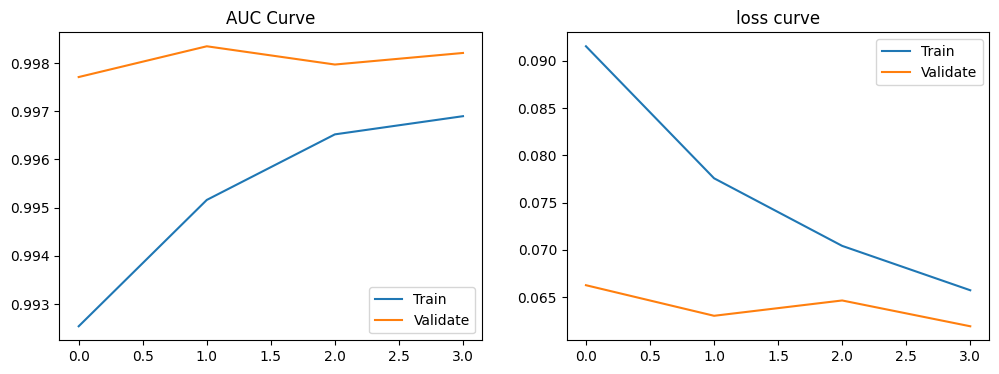

71/71 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step - accuracy: 0.9763 - auc: 0.9978 - loss: 0.0627 - precision: 0.9791 - recall: 0.9731
Finl Result:
- Accuracy: 97.45%
- AUC: 0.9977
- Precision: 0.9766
- Recall: 0.9723


In [ ]:

plt.figure(figsize=(12, 4))
plt.subplot(121)
plt.plot(history.history['auc'], label='Train')
plt.plot(history.history['val_auc'], label='Validate')
plt.title('AUC Curve')
plt.legend()

plt.subplot(122)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validate')
plt.title('loss curve')
plt.legend()
plt.show()

loss, accuracy, auc, precision, recall = model.evaluate(test_ds)
print(f"Finl Result:")
print(f"- Accuracy: {accuracy:.2%}")
print(f"- AUC: {auc:.4f}")
print(f"- Precision: {precision:.4f}")  # Print precision
print(f"- Recall: {recall:.4f}")  # Print recall

In [ ]:

del  labels, x_train, x_test, y_train, y_test
gc.collect()

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report 
def build_test_dataset(paths, labels):
    def load_image(path, label):
        image = tf.io.read_file(path)
        image = tf.image.decode_jpeg(image, channels=3)
        # image = tf.image.resize(image, [380, 380])  
        image = tf.cast(image, tf.float32) / 255.0
        label = tf.one_hot(label, depth=3)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    # Change drop_remainder to False or remove it for prediction/evaluation
    dataset = dataset.batch(32, drop_remainder=False).prefetch(tf.data.AUTOTUNE)
    return dataset

prediction_dataset = build_test_dataset(X_test, y_test)

y_pred = model.predict(prediction_dataset)  # Use the prediction_dataset here
y_pred_classes = np.argmax(y_pred, axis=1)

print(classification_report(y_true, y_pred_classes))

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix # Import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns # Import seaborn for heatmap

# Confusion Matrix
num_classes= 3
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report # Import classification_report

def build_test_dataset(paths, labels):
    def load_image(path, label):
        image = tf.io.read_file(path)
        image = tf.image.decode_jpeg(image, channels=3)
        # image = tf.image.resize(image, [380, 380])  # Resize image to match model input
        image = tf.cast(image, tf.float32) / 255.0
        label = tf.one_hot(label, depth=3)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(32).prefetch(tf.data.AUTOTUNE)  # Adjust batch size as needed
    return dataset


test_dataset = build_test_dataset(X_test, y_test)

# Evaluate the model
y_pred = model.predict(test_dataset)  # Use the test_dataset here
y_pred_classes = np.argmax(y_pred, axis=1)

# Convert y_test to one-hot encoded format before applying argmax
y_test_one_hot = tf.keras.utils.to_categorical(y_test, num_classes=3) # Assuming 3 classes
y_true = np.argmax(y_test_one_hot, axis=1)

print(classification_report(y_true, y_pred_classes))

72/72 ━━━━━━━━━━━━━━━━━━━━ 36s 399ms/step
              precision    recall  f1-score   support

           0       0.99      0.89      0.94       665
           1       0.57      1.00      0.73       628
           2       0.98      0.59      0.73       994

    accuracy                           0.79      2287
   macro avg       0.85      0.82      0.80      2287
weighted avg       0.87      0.79      0.79      2287



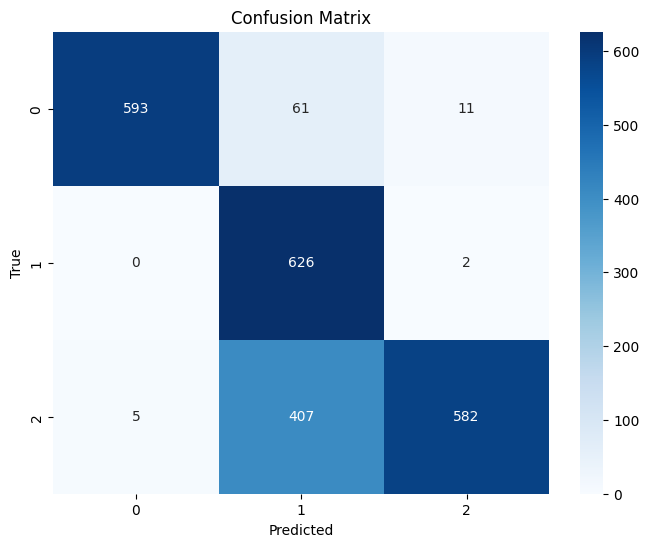

In [14]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix # Import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns # Import seaborn for heatmap

# Confusion Matrix
num_classes= 3
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


## Saving and Loading Model

In [ ]:
model.save('/content/drive/MyDrive/skin_canser_model.keras')

In [ ]:
model = load_model()
# checking the accuracy
accuracy = model.evaluate(test_ds, verbose=1)
print('\n', 'Test_Accuracy:-', accuracy[1])

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'loss_scale_optimizer', because it has 465 variables whereas the saved optimizer has 923 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 461 variables whereas the saved optimizer has 919 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


62/62 ━━━━━━━━━━━━━━━━━━━━ 32s 293ms/step - accuracy: 0.9618 - auc: 0.9960 - loss: 0.0780 - precision: 0.9664 - recall: 0.9586

 Test_Accuracy:- 0.9657257795333862


72/72 ━━━━━━━━━━━━━━━━━━━━ 33s 375ms/step
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       665
           1       0.96      0.97      0.97       628
           2       0.97      0.97      0.97       994

    accuracy                           0.97      2287
   macro avg       0.97      0.98      0.98      2287
weighted avg       0.97      0.97      0.97      2287



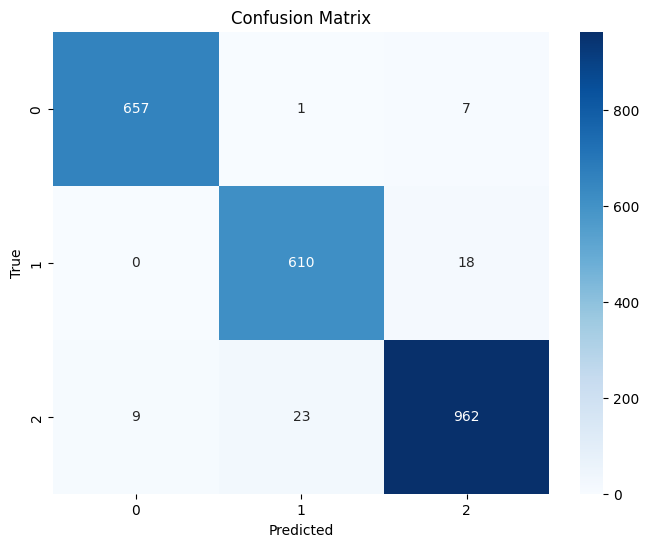

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix # Import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns # Import seaborn for heatmap
from tensorflow.keras.models import load_model # Assuming load_model is needed based on context

# Rebuild test_ds with drop_remainder=False
# This function was defined earlier in the notebook
def build_dataset(paths, labels, shuffle=True, drop_remainder=True):
    def load_image(path, label):
        image = tf.io.read_file(path)
        image = tf.image.decode_jpeg(image, channels=3)
     
        image = tf.cast(image, tf.float32) / 255.0
        label = tf.one_hot(label, depth=3)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))
    if shuffle:
        dataset = dataset.shuffle(buffer_size=int(len(paths)*0.3), seed=SEED)

    dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    # Set drop_remainder=False for the test dataset
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=drop_remainder)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

# Recreate the test_ds dataset with drop_remainder=False
test_ds = build_dataset(X_test, y_test, shuffle=False, drop_remainder=False)

# Use the test_ds dataset for prediction, which provides image data directly
rounded_predictions = model.predict(test_ds, verbose=1)

y_pred_classes = np.argmax(rounded_predictions, axis=1)

# The original y_test is a list of numerical labels.
# You need to convert it to a NumPy array to work with sklearn's confusion_matrix.
y_true = np.array(y_test)

# You can now use y_true (the actual labels from X_test) and y_pred_classes
# for evaluation metrics like the confusion matrix and classification report.

# Classification Report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))

# Confusion Matrix
num_classes = len(np.unique(y_true)) # Dynamically get the number of unique classes in y_true
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
rounded_predictions = model.predict(X_test, batch_size=16, verbose=0)
rounded_predictions[1]

In [ ]:
import itertools
pred = np.argmax(rounded_predictions,axis=1)
rounded_labels=np.argmax(y_test, axis=1)
# rounded_labels = np.argmax(y_test_one_hot, axis=1)
pred_Y = model.predict(x_test, batch_size = 16, verbose = True)
BS=16
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    target_names =['BCC','Melanoma','Nevus']

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Predict the values from the validation dataset
Y_pred = model.predict(x_test, batch_size=BS)
# Convert predictions classes to one hot vectors
Y_pred_classes = np.argmax(pred_Y,axis=1)
# Convert validation observations to one hot vectors
# compute the confusion matrix
#rounded_labels=np.argmax(y_test, axis=1)  <-- Incorrect
rounded_labels = np.argmax(y_test_one_hot, axis=1) # <-- Use this instead
confusion_mtx = confusion_matrix(rounded_labels, Y_pred_classes)



# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(3))



# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(3))

In [ ]:
predIdxs = model.predict(x_test, batch_size=BS)

# for each image in the testing set we need to find the index of the
# label with corresponding largest predicted probability
predIdxs = np.argmax(predIdxs, axis=1)
rounded_labels=np.argmax(y_test_one_hot, axis=1)

# show a nicely formatted classification report
print(classification_report(rounded_labels, predIdxs,target_names=['BCC','Melanoma','Nevus']))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
              precision    recall  f1-score   support

         BCC       0.67      0.67      0.67         3
    Melanoma       0.00      0.00      0.00         3
       Nevus       0.50      0.75      0.60         4

    accuracy                           0.50        10
   macro avg       0.39      0.47      0.42        10
weighted avg       0.40      0.50      0.44        10



In [ ]:
predIdxs = model.predict(x_test, batch_size=BS)

# for each image in the testing set we need to find the index of the
# label with corresponding largest predicted probability
predIdxs = np.argmax(predIdxs, axis=1)
rounded_labels=np.argmax(y_test, axis=1)

# show a nicely formatted classification report
print(classification_report(rounded_labels, predIdxs,target_names=['BCC','Melanoma','Nevus']))

              precision    recall  f1-score   support

         BCC       0.98      0.99      0.99       644
    Melanoma       0.98      0.95      0.96       921
       Nevus       0.96      0.98      0.97       894

    accuracy                           0.97      2459
   macro avg       0.97      0.97      0.97      2459
weighted avg       0.97      0.97      0.97      2459



# Plotting ROC AUC

72/72 ━━━━━━━━━━━━━━━━━━━━ 20s 277ms/step


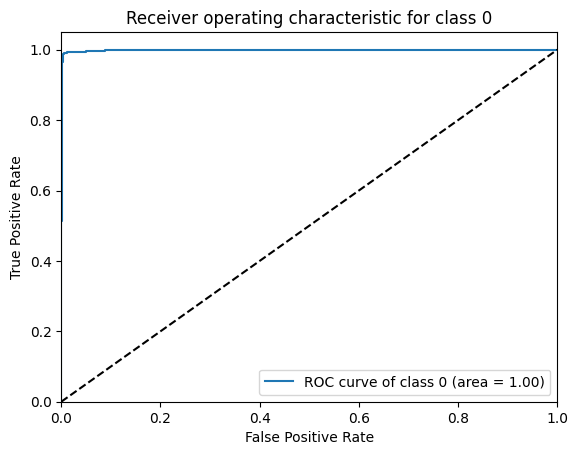

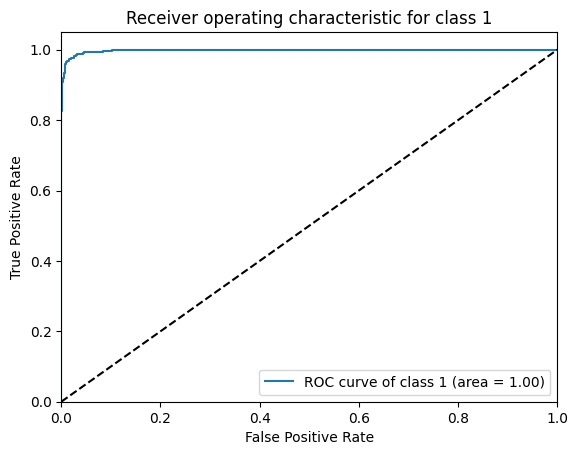

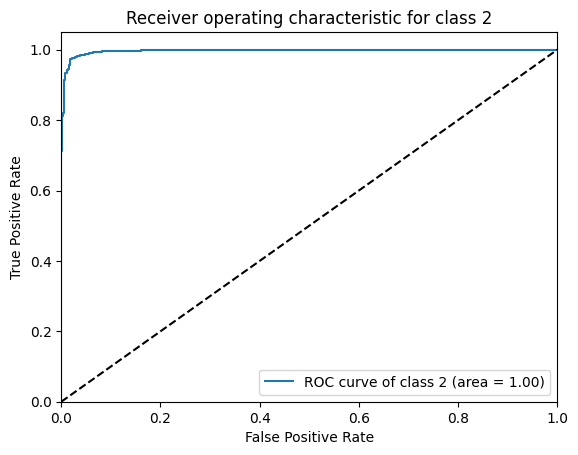

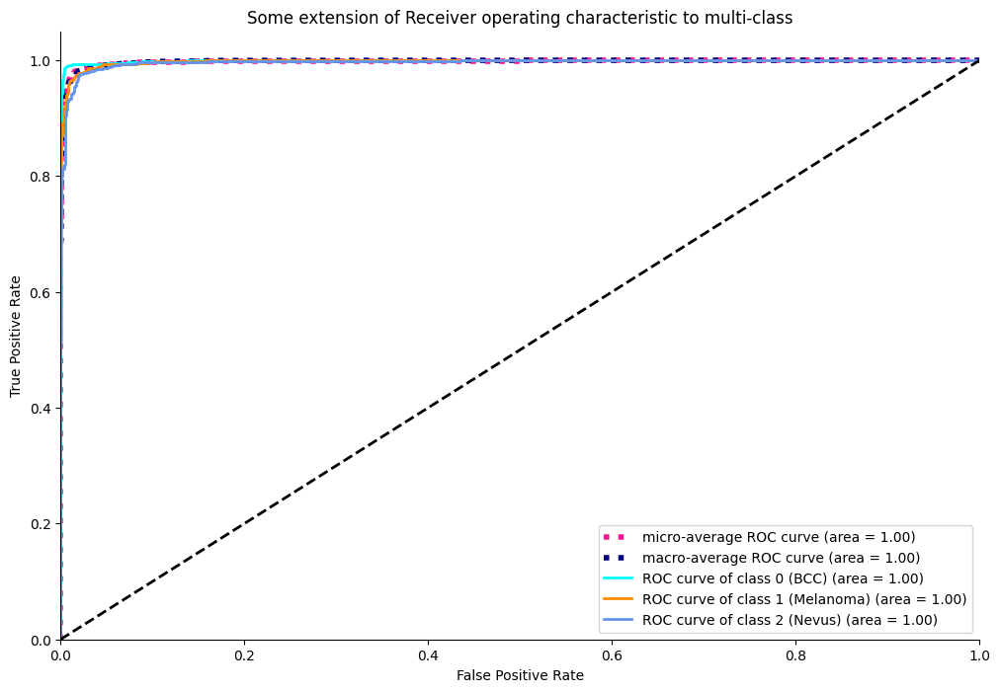

In [23]:
import seaborn as sns
import pandas as pd
from sklearn.datasets import make_classification
from sklearn.preprocessing import label_binarize
from numpy import interp
from itertools import cycle
import pandas as pd
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.utils import to_categorical
import tensorflow as tf # Import tensorflow

# Ensure test_ds is created before this cell runs
# The build_dataset function should be defined and executed prior to this cell

# Get predictions from the model using the test dataset
# model.predict can accept a tf.data.Dataset
pred_Y = model.predict(test_ds)

# Extract true labels from the test_ds
# We need to iterate through the dataset to get all true labels
true_labels = []
for images, labels in test_ds:
    true_labels.append(labels.numpy()) # Get NumPy array from tensor

# Concatenate the true labels from all batches
y_test_onehot = np.concatenate(true_labels, axis=0)


n_classes = 3

# Plot linewidth.
lw = 2

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

# y_test_onehot is already in one-hot encoding format from the dataset
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_onehot[:, i], pred_Y[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_onehot.ravel(), pred_Y.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {i} (area = {roc_auc[i]:0.2f})') # Changed label format
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver operating characteristic for class {i}') # Changed title
    plt.legend(loc="lower right")
    plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    # Ensure fpr[i] and tpr[i] are sorted before interp
    # This might be implicitly handled by roc_curve, but good to be aware
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
fig = plt.figure(figsize=(12, 8))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
target_names =['BCC','Melanoma','Nevus'] # Define target names for the legend
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} ({1}) (area = {2:0.2f})' # Added class name to label
             ''.format(i, target_names[i], roc_auc[i]))


plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
sns.despine()
plt.show()

63/63 ━━━━━━━━━━━━━━━━━━━━ 19s 291ms/step


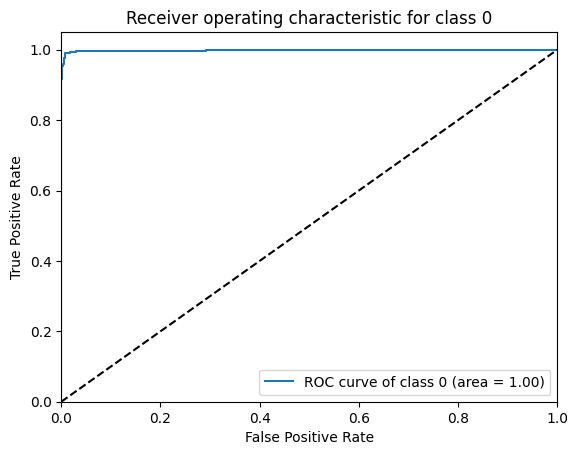

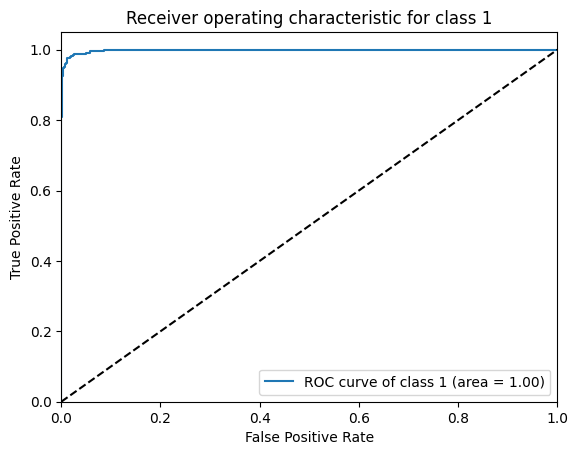

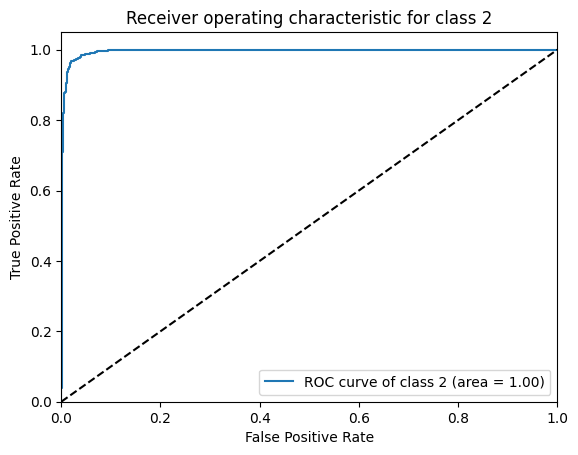

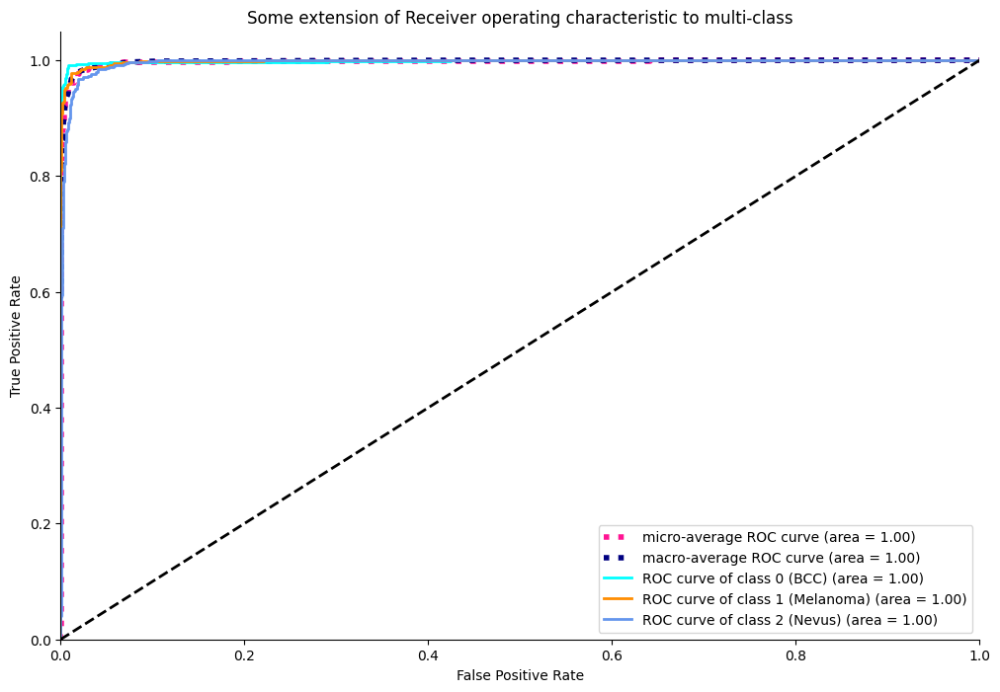

In [ ]:
import seaborn as sns
import pandas as pd
from sklearn.datasets import make_classification
from sklearn.preprocessing import label_binarize
from numpy import interp
from itertools import cycle
import pandas as pd
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.utils import to_categorical
import tensorflow as tf # Import tensorflow

# Ensure test_ds is created before this cell runs
# The build_dataset function should be defined and executed prior to this cell

# Get predictions from the model using the test dataset
# model.predict can accept a tf.data.Dataset
pred_Y = model.predict(test_ds)

# Extract true labels from the test_ds
# We need to iterate through the dataset to get all true labels
true_labels = []
for images, labels in test_ds:
    true_labels.append(labels.numpy()) # Get NumPy array from tensor

# Concatenate the true labels from all batches
y_test_onehot = np.concatenate(true_labels, axis=0)


n_classes = 3

# Plot linewidth.
lw = 2

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

# y_test_onehot is already in one-hot encoding format from the dataset
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_onehot[:, i], pred_Y[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_onehot.ravel(), pred_Y.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {i} (area = {roc_auc[i]:0.2f})') # Changed label format
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver operating characteristic for class {i}') # Changed title
    plt.legend(loc="lower right")
    plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    # Ensure fpr[i] and tpr[i] are sorted before interp
    # This might be implicitly handled by roc_curve, but good to be aware
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
fig = plt.figure(figsize=(12, 8))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
target_names =['BCC','Melanoma','Nevus'] # Define target names for the legend
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} ({1}) (area = {2:0.2f})' # Added class name to label
             ''.format(i, target_names[i], roc_auc[i]))


plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
sns.despine()
plt.show()

154/154 [==============================] - 2s 16ms/step


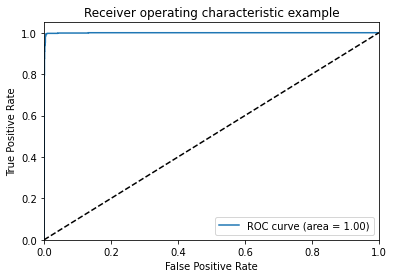

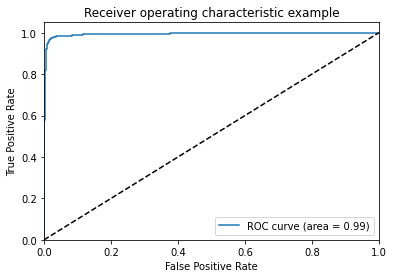

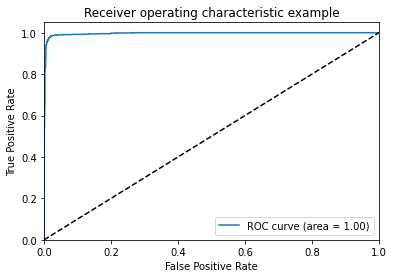

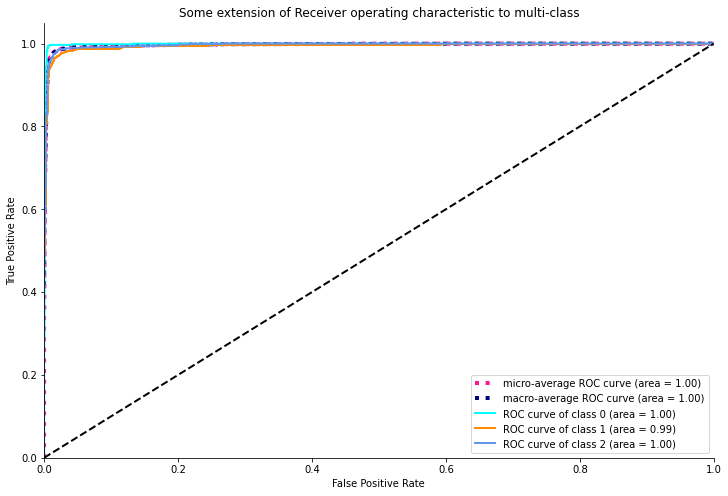

In [ ]:
import seaborn as sns
import pandas as pd
from sklearn.datasets import make_classification
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle
import pandas as pd
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc


y_test = np.array(y_test)

n_classes = 3

pred_Y = model.predict(x_test, batch_size = 16, verbose = True)
# Plot linewidth.
lw = 2

# Compute ROC curve and ROC area for each class


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], pred_Y[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    # Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), pred_Y.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
fig = plt.figure(figsize=(12, 8))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))


plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
sns.despine()
plt.show()

## Preparing Test Data

In [ ]:
data=[]
labels=[]
Basal=os.listdir("/content/drive/My Drive/skin_cancer_dataset/Basal_cell_carcinoma/test/")
for a in Basal:
    try:
        image=cv2.imread("/content/drive/My Drive/skin_cancer_dataset/Basal_cell_carcinoma/test/"+a)
        image_from_array = Image.fromarray(image, 'RGB')
        size_image = image_from_array.resize((224, 224))
        data.append(np.array(size_image))
        labels.append(0)
    except AttributeError:
        print("")

Melanoma=os.listdir("/content/drive/My Drive/skin_cancer_dataset/Melanoma/test/")
for b in Melanoma:
    try:
        image=cv2.imread("/content/drive/My Drive/skin_cancer_dataset/Melanoma/test/"+b)
        image_from_array = Image.fromarray(image, 'RGB')
        size_image = image_from_array.resize((224, 224))
        data.append(np.array(size_image))
        labels.append(1)
    except AttributeError:
        print("")
Nevus=os.listdir("/content/drive/My Drive/skin_cancer_dataset/Nevus/test/")
for c in Nevus:
    try:
        image=cv2.imread("/content/drive/My Drive/skin_cancer_dataset/Nevus/test/"+c)
        image_from_array = Image.fromarray(image, 'RGB')
        size_image = image_from_array.resize((224, 224))
        data.append(np.array(size_image))
        labels.append(2)
    except AttributeError:
        print("")

In [ ]:
feats_test=np.array(data)
labels_test=np.array(labels)

np.save("/content/drive/My Drive/skin_cancer_dataset/feats_test",feats_test)
np.save("/content/drive/My Drive/skin_cancer_dataset/labels_test",labels_test)

150


In [ ]:
feats_test=np.load("/content/drive/My Drive/skin_cancer_dataset/feats_test.npy")
labels_test=np.load("/content/drive/My Drive/skin_cancer_dataset/labels_test.npy")

num_classes=len(np.unique(labels_test))
len_data=len(feats_test)
print(len_data)

150


In [ ]:
x_valid = feats_test.astype('float32')/255
y_valid=to_categorical(labels_test,3)

In [25]:
pred_Y = model.predict(test_ds)
rounded_predictions = model.predict(X_test, batch_size=16, verbose=0)
pred = np.argmax(rounded_predictions,axis=1)
rounded_labels=np.argmax(y_valid, axis=1)
BS=10
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    target_names =['BCC','Melanoma','Nevus']

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Predict the values from the validation dataset
Y_pred = model.predict(x_valid, batch_size=BS)
# Convert predictions classes to one hot vectors
Y_pred_classes = np.argmax(pred_Y,axis=1)
# Convert validation observations to one hot vectors
# compute the confusion matrix
rounded_labels=np.argmax(y_valid, axis=1)
confusion_mtx = confusion_matrix(rounded_labels, Y_pred_classes)
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(3))

72/72 ━━━━━━━━━━━━━━━━━━━━ 22s 295ms/step


ValueError: Unrecognized data type: x=['/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054390.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068791.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026175.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071116.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7273803.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6753831.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071899.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028138.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7354493.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064510.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030252.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024860.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7579536.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066009.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061603.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7059563.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016065_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059124.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072539.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025054.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026851.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059517.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7323761.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014675_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7225725.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6763221.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0032816.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025695.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029718.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029197.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000387_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024959.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059254.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072406.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7582764.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026535.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057825.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068777.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030059.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6786974.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6948332.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7107128.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065082.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027134.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6930612.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031336.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7433711.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071864.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031983.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063586.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025907.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026193.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000214.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058787.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059063.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024394.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030777.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6856140.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067876.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7027535.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060011.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028754.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7597293.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029221.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015625_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064439.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032089.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6691662.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026805.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028135.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0029899.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7327592.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7175078.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7495148.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7404470.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065570.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6688311.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071156.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028583.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032143.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028419.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7385112.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028796.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024392.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7044635.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6866979.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030103.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055323.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026384.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030156.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028377.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065330.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068742.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026617.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7403913.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6831244.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025574.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031773.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054745.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6806540.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030200.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031264.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015216_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027691.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7397447.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025561.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058539.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6985114.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026911.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027812.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025441.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026099.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0073063.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066689.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7580408.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025426.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060906.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027902.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072842.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028893.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6978587.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7010626.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7577395.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072345.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026141.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025011.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070831.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067182.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7365363.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025558.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0002353_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6888012.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011372.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065589.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7204370.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065151.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7491389.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7336383.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031943.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032495.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055038.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055096.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059847.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025307.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057909.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028110.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6892485.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6967143.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069032.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031862.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6722934.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025242.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063562.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032309.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030686.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032814.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7351939.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7557455.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032647.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058698.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060973.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072942.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013112_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6778756.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7294478.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6683370.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055748.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028392.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032119.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0033020.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7413786.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069249.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7461124.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7251940.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029531.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7302456.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6660247.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071157.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027410.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7145302.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055791.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070128.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032632.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7235371.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6860222.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030046.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7476803.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063209.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6668604.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068590.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062150.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6718077.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7198492.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031824.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012322_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027688.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010215.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000000.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053719.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014004_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6935634.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027919.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7452871.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6864170.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030433.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061824.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025444.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6665312.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024606.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026874.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6959018.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6985996.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068969.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029607.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030418.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058264.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6881780.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067774.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029825.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026554.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015364_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7562708.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010382.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072505.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7179363.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7029652.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010006.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066103.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054843.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070825.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6761269.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7062293.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7313049.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031392.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6730455.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028339.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031645.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029861.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064351.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070034.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058387.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014937_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024483.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6946330.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062386.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070911.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013836_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7388850.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011167.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024425.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7527782.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058415.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060922.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030864.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032502.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032427.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028019.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7306535.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064753.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6962990.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013803_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6941010.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029187.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029761.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7459410.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6851482.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065666.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6888864.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066894.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055225.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0034155.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7002958.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025496.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055347.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030339.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7571378.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030306.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024540.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029736.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7606860.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010455.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029330.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6816081.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024397.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065483.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025773.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7533116.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054905.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069168.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056691.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015161_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016038_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030737.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031293.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6668308.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0003346_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072693.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027049.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029250.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029948.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026237.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031476.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7391660.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056826.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000192_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025028.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6757635.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030537.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026592.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7034769.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011109.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7343355.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067988.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7587006.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026136.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013527_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031267.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031551.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069023.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7001072.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026075.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6992709.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058463.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0024885.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013996_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030312.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072880.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059670.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7337102.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7290085.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061543.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025944.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7418756.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030601.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058061.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0027425.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7437712.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6819137.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031842.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055539.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011347.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6734262.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060582.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015419_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027396.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032560.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026428.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7018137.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7458272.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000506.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030284.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7583922.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012233_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030322.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056503.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065063.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062926.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025126.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013480_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013689_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7179845.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069206.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032864.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068529.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0025711.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071724.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031028.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069422.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7187577.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069503.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030288.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028566.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029335.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7484011.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6855540.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026504.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053504.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029018.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062634.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071005.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027324.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028791.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065710.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026772.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7059790.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000388_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009987.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0006326_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024621.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068415.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028005.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028072.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064163.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7153006.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028715.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0029352.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7147168.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069915.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028169.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062007.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069628.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053472.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6708074.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027997.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0032061.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027459.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026057.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010017.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057384.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027848.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0027915.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6667142.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028875.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057086.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031803.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062093.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7273849.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016011_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0004110_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026581.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7296130.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030063.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063007.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027929.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030354.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065249.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065835.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053813.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067999.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031247.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071110.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061055.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059724.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030524.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7497699.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071692.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026410.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029225.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7220767.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026657.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0073061.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056088.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6785680.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7038586.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6993129.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7229261.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024868.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7312977.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060112.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063004.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031450.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069049.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030508.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032068.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024500.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059845.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7335659.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6757973.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030878.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028128.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7097507.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071251.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6901997.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6954577.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029800.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6916987.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014868_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026144.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027660.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031610.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0024432.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6968982.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009078_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055510.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0025433.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030558.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7544460.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064456.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059682.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057010.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012182_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029401.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024355.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024749.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059815.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7037032.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6690602.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031486.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025338.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012655_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7175873.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012940_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014846_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060274.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027889.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0073091.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032093.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000235.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026698.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069144.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032731.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067714.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7542408.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7429127.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7105681.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012949_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7252425.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7232117.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000442_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013219_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026064.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066271.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7575857.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027894.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7418723.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068659.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7079599.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065721.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065391.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6875113.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032562.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009583_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026004.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7472875.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063779.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032336.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058765.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7478025.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6917681.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7619234.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063825.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6830414.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057751.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029240.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026609.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028999.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7373780.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055779.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0029847.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068632.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058257.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070081.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015035_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011098.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071448.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030350.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028737.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061908.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7253561.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6932694.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072511.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7102464.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072809.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066569.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6851030.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028441.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6948604.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056585.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032357.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7380353.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012674_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026211.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024887.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061081.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7461631.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062837.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025290.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7194377.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032639.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072660.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029261.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027885.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0073170.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070057.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061346.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6882080.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7072658.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032818.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7079582.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053599.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028814.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031990.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031641.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057179.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031932.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031127.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6718307.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026054.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061303.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009872.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054370.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068109.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030362.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6749024.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054316.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7309194.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026712.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7279060.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065108.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013804_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7329684.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011326.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0025031.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7067156.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058905.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024950.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7442476.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025135.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012118_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059453.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000227.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055392.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7441567.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015264_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068236.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7113612.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7494122.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029540.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7288992.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000545.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026037.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0033066.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032153.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065440.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069421.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000468.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027444.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067163.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0001185_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7233663.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028600.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0008659_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6854940.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031258.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6767017.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070183.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067954.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069261.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027092.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028047.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062737.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069424.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031068.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7403276.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032700.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066842.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031030.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6913272.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6938217.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010237.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031560.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000479.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070700.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7514918.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7550917.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024639.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031527.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016045_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029105.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031514.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031777.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7352489.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0033045.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054939.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026860.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014677_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7364041.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067429.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024648.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032786.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026578.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031171.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068124.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025737.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7169011.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027264.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6814382.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6657600.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7178155.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7551447.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028703.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029923.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027569.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032590.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024416.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063200.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7552521.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031373.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7015532.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061344.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025041.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031673.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015330_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016054_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056840.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029226.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062228.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067106.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028096.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028643.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7614221.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064325.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028035.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011383.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015008_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7180943.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032172.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7577197.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030567.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7229814.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030363.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031864.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0026940.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055555.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015988_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7371985.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026688.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7016783.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060392.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057275.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027715.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000369.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026836.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031635.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026020.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000015.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7110371.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063166.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6736990.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027180.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013961_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000032_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6917179.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061437.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032930.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0027371.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025845.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028762.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029611.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024713.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7097665.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7252784.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025423.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029256.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067400.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054658.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7578777.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064899.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7114660.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058337.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030543.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6779136.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072082.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027495.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060602.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0026766.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070534.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060680.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065310.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7076773.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010361.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0025731.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065752.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061174.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072084.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7196094.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025259.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072450.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024990.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7495157.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026047.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0024666.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027491.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030371.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026169.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7172893.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7166976.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027955.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000341.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061386.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025461.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030301.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056550.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025921.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072342.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030761.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011327.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025934.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6759319.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030772.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031140.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000556.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026985.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011303.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061290.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032278.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013197_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7383521.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061020.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065743.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026082.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032977.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028654.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059324.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029350.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009932.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028078.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0006711_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7576735.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066221.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7021739.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025868.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000473_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7305051.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062090.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6855226.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031861.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030013.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013837_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7241614.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032676.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7053271.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032996.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6734859.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029259.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031367.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6680649.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057279.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7097343.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031793.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072105.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028708.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027009.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0024436.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6687278.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7169653.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031011.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013032_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058223.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013595_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029792.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069477.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027124.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6771810.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016007_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013511_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065401.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027062.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7284436.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065453.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6777153.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029551.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013275_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071419.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000352.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027356.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030590.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6686271.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028819.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065051.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7523226.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067492.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059656.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025213.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060189.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063546.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7294446.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0024665.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009917.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030449.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066736.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029796.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055855.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6914698.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0002439_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7066695.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7164567.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7510327.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000315.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032591.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067819.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063031.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7517099.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024892.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0032461.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7133051.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032631.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6813250.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7342658.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064612.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064075.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064661.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6927363.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014665_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030097.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7291472.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025801.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015270_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071730.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7528105.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7109582.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059106.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0025576.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029154.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026695.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056866.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024307.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068339.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7335835.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6826081.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7526548.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060081.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030582.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031924.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7483552.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012303_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071604.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032825.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032273.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7511011.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7459066.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015496_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031236.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032485.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029255.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060214.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031833.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063382.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030416.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028279.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070266.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028835.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015011_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027703.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7366196.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030340.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014760_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6840388.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010856.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068985.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7494568.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066340.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7039203.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7067750.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7280815.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025398.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032346.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072117.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7213231.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028507.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060429.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030428.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013306_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7370970.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032451.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028904.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7611972.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010848.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072649.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6888402.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060149.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028661.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063512.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062601.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072670.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027765.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063587.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0032185.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7270978.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7356954.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7515794.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065044.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7438913.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7563371.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7021681.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028122.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063964.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6829909.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069936.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0024360.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7464965.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065833.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030462.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028274.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7536704.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067595.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030856.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028629.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030709.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7183272.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060007.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010442.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012672_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7241549.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6782861.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6760466.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028434.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030975.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6653780.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0073059.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000250.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7128233.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0027609.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062527.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067154.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031816.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029561.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060127.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053549.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7183251.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6738013.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028665.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015981_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7010345.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000332.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027685.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066850.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7027536.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6723937.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032351.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061157.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7393413.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7522708.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030766.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7367184.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030010.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026147.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024775.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055861.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026856.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026007.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7063629.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000087_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000034_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000268.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029623.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013094_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027353.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028606.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012741_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024642.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013592_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026119.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061208.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032465.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012710_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7505633.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064210.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6814221.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7398749.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027823.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7271745.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030797.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030398.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7194695.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030894.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6931593.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058567.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025688.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055330.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056681.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027364.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6876932.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6901340.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032939.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6899397.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055629.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072211.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071295.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029957.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028042.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024727.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060137.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7565550.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7035373.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059231.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7605996.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030496.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030330.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7304480.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031116.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030674.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026210.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7269812.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030921.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069742.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069300.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015996_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054773.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025747.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056187.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7611850.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029661.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7332135.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056990.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015026_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010452.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060859.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029374.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7072802.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063025.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6655446.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029354.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031478.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000345.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6790442.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024551.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027197.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7183212.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028477.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7171580.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072761.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028408.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062399.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027418.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030269.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058819.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7500665.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028365.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072914.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025215.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7350351.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7410794.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0027825.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056703.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071400.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7115483.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032221.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056965.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026049.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6997313.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032163.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029114.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7011122.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026222.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025080.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067818.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072365.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059334.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032496.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029534.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030625.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061473.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7288818.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7219333.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000129_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027963.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069709.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027272.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059135.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7420182.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7449606.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000011.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067386.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7046888.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029143.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025912.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6988514.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024759.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027429.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6952773.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026887.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026838.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7434918.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015146_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027985.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066701.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7200497.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066070.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7125610.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026935.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0001296_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054623.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057292.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059033.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058767.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6918995.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7318632.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7071944.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7284377.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031166.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030058.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0027526.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6983970.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055291.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7499769.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031807.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026165.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6853584.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069886.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6852313.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031643.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7287338.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032962.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028409.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059746.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028695.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015369_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029750.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010477.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061778.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024921.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0033006.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029520.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031923.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068050.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061889.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031224.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028395.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060991.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032555.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059758.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0032611.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070150.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031797.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7322169.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7135022.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024563.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025516.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028183.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013001_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7412559.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7301359.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059755.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057393.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011317.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0025144.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027766.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055744.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6856867.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072750.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030511.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058703.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026793.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6756517.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0002879_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065231.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030527.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0027744.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066960.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014755_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011082.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028719.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027061.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069185.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011084.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029719.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026880.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000186_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013789_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025379.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059917.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7501268.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6691217.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7365523.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025547.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7050328.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0026433.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7505675.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6803432.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066549.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026873.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032130.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009875.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026244.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013495_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013461_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062287.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030228.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053501.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061861.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009869.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072776.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027288.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000237.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058997.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026942.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053537.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057456.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070436.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6977581.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026863.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013055_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060588.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027975.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032994.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7614036.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028207.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6726818.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028757.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0033579.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6679694.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032288.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030037.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0033098.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7580756.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053873.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013778_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027074.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7367323.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031098.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026824.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6961482.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028514.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028251.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060542.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028589.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066707.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025854.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012520_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6895016.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031617.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062393.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028466.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7523330.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6733338.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024966.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016046_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014174_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029303.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031252.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7195168.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026461.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6853786.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010193.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6706678.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055275.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030905.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013596_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012708_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066469.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026917.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0024595.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6842688.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030197.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061324.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7198004.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024907.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7491217.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066676.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7520581.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069804.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6903643.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7170391.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028978.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030622.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7400392.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7311996.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7574629.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7602656.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026852.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011393.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028032.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014930_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026830.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025421.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024306.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064588.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026145.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6934041.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030833.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059988.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6868834.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7396523.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063794.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000316.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029273.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056737.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7131359.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054365.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7590292.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067079.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6970607.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7413795.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7198887.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7453902.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029090.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027787.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000242.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060533.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027809.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7222438.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6666835.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025318.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7387061.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6710411.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026498.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025581.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7059403.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010336.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7465470.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025936.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012325_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064734.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7287303.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009188_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068669.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025532.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015244_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025365.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013911_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062544.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013070_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031007.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6915808.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065922.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028016.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026633.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7477061.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032575.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7185036.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029621.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016068_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010102.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0004166_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064556.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7231369.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6817651.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070883.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064300.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7514840.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027833.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6709150.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024902.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015060_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6901670.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6713263.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0032225.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063227.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032162.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065879.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0027004.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7599444.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072465.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6876309.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015975_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032090.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7353400.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6804899.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027740.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7436851.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7070020.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025999.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000187.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029150.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061587.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026782.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7267098.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6994237.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027557.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066363.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061571.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032760.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016035_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026943.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7423788.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6702684.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055850.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013695_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066954.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072772.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6712342.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7564545.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7331345.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028283.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0034058.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7083307.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7255445.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030210.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6777986.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012487_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011300.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0033720.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7590008.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7052038.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027347.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057409.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071967.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024841.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6954782.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028450.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065556.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026088.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025048.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0002829_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024734.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028396.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027292.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7619467.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059548.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7407589.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6841463.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025208.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031383.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028217.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012278_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053762.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026603.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032442.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028174.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010173.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015215_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029979.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7136896.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030729.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025641.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6967033.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032385.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0034223.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7478847.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071150.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030896.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030848.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031576.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026991.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013355_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027726.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054817.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7376268.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014328_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066157.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026406.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000020_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7189167.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030084.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7368239.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6839272.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067572.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0073033.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015311_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030453.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065083.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0032384.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055882.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0073196.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7344014.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7220622.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024369.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6996877.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031026.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6945603.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061316.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062927.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024813.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009906.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7111646.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6656373.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053649.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027298.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030581.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028788.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071056.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7096402.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7397420.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032523.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7178222.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059680.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057175.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056321.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7448231.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030626.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6687321.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7454927.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024493.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027971.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6746530.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026964.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015948_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028781.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026053.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069792.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059111.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057088.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7381795.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025072.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025430.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012941_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031678.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025689.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000065_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028723.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0033054.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7059744.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025858.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6665380.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6916479.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7186410.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062231.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029743.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061054.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026048.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032452.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027475.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7130929.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7461086.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031836.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6744531.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7447716.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7280886.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031832.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062332.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028329.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7230300.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057757.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029628.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028341.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0024795.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031750.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058578.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028234.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064657.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071549.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014853_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026711.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030490.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7047391.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013966_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030434.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030834.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032007.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028944.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028152.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7388369.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068030.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6968933.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7498716.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069555.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060439.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7567861.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027530.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7075789.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029349.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027482.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7123674.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7090755.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6906476.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6889965.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058466.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7599869.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009975.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7156715.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014921_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032055.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6947576.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027080.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7038741.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071589.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055812.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6926090.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7601418.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031717.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7230713.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012788_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026077.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013965_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054018.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067221.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057989.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011115.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7151508.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024986.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026819.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024365.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060514.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027348.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015018_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068306.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016049_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030573.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6700235.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7528308.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6704036.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032475.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013084_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062191.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016034_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067295.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6665667.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028562.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7268592.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068032.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7281296.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025549.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054985.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014818_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7424256.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029716.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064064.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025443.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027078.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7178818.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6814294.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029438.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012175_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6882841.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024681.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065624.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7182677.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031062.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057574.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031652.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7583644.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0026952.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029953.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029494.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065047.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069703.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024658.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055721.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030563.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066623.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026189.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6833905.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029724.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7309302.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0068856.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025702.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000234.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063947.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024757.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6909624.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7363304.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028669.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7150606.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028786.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032600.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024473.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6982406.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058704.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015226_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025163.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6684371.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031866.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065212.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026315.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025420.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7356842.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6984529.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011297.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070665.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032518.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013090_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055221.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057587.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016040_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016062_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072935.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0033043.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059113.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071236.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064149.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029388.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7620514.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7612427.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7100755.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7154675.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064684.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069132.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056220.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7212966.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030656.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058744.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032743.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063865.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070673.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063159.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031356.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6739727.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061076.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0001247_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066144.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7321960.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030403.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032612.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0027057.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026011.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6700528.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058687.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015937_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000503.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6809586.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070102.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030177.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026600.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027426.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7546480.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055493.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028547.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012442_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7131973.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032735.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6943717.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000218_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028910.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6961503.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7142856.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6842453.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010340.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024378.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0025509.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032505.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7461756.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026676.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028616.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012746_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6832628.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7039745.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013971_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7622520.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057732.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7274757.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7185482.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0007087_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059617.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069038.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070625.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6729594.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028673.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064639.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071003.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014838_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032795.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028891.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031067.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028928.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6816608.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031483.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060748.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7384638.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058227.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7130059.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032620.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026520.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029910.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027293.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028107.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025517.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7017387.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014743_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030819.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071199.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014720_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031120.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056950.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032973.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6810219.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7148289.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031375.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031991.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060021.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063090.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6792644.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6790949.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7536256.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031531.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7167947.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054849.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7372719.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010234.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026148.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7273853.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027571.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028351.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7537335.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0033551.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066054.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6911333.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029239.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060003.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067679.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025865.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028670.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027984.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072931.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029347.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013340_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031909.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025541.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7466341.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060981.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026899.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000494.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024780.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032728.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6848560.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0026656.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029887.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053771.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025243.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070381.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0031925.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027933.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6817776.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013561_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7520584.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028617.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7619022.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7533216.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7122078.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7116781.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024821.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061907.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7518478.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024684.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069329.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6666608.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014697_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7263013.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025823.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6928990.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7518798.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056709.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031811.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067110.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028602.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026499.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6814608.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028168.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000243.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7135134.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6914893.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7278553.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026883.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7253878.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030147.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013213_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6971606.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7208412.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025821.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070958.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070721.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029422.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029529.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7105964.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000329.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025007.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6652710.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058833.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0016063_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024936.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026537.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0025322.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028316.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066282.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6781665.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0029489.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030859.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014844_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024580.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7348651.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064293.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7563283.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071029.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056027.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030196.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071923.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066137.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7520408.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067772.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7019211.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055703.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063928.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032541.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059946.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7231735.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060645.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071792.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026512.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031638.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030040.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055693.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013523_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066747.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032787.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7574101.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026878.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7073459.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025914.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031114.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0053712.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058995.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0008347_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028023.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063083.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069407.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028632.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072701.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024631.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070088.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0032439.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7387265.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054088.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055963.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7545340.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057910.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032028.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032126.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7139346.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030402.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063572.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063462.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067524.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032954.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000436_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054722.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6938608.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027439.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7068674.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065971.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026418.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058520.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7485354.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032009.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7119225.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6876691.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6959955.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015201_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067659.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056953.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027416.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0001769_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055471.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032891.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030647.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028485.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031174.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7184836.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014907_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7575644.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030514.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057592.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6673506.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025527.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6789719.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029336.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058782.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065508.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060401.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010013.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055032.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7106766.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7421856.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026508.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032770.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7207715.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027596.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010261.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069299.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0032092.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064898.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012804_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059994.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031613.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055497.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027395.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7566258.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6971970.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027503.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7230027.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028421.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024407.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056099.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031891.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7543427.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025658.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6654565.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064843.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030264.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025273.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025165.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026447.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028922.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030461.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7452815.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071637.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6931468.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061490.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025245.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6787039.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7621674.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6871068.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030198.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027358.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055671.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031180.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055716.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064030.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7095248.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0015955_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7344252.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029470.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030430.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032737.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027209.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7249761.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026922.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0033046.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7315468.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029712.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7483981.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065077.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031756.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0029123.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027314.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030526.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060144.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030343.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0071890.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028967.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067668.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031290.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7253930.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0062052.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032380.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065699.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070312.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013748_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7452767.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027340.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065207.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030111.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7233703.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0011292.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027127.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025137.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058868.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024671.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031579.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7303102.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024692.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029005.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7077740.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031115.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058116.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0012905_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030152.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6815524.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032885.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0061512.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000515.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066696.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025528.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7040375.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7618200.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6870647.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058130.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000486.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030823.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030008.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024944.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0010488.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7106848.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066489.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070909.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7612992.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0030954.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060117.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069423.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0058193.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027019.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6717322.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7571027.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013025_downsampled.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6843536.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6976235.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056219.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0060512.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0025168.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064223.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7417678.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7452348.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0008507_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013173_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072260.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054619.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7134821.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7345367.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6953126.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055706.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026218.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029665.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7300631.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6970590.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031374.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027911.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028529.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026542.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6682918.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031828.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6863026.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0000208_downsampled.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024653.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072545.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7432430.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030817.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6815964.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031857.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7520843.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6850613.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066555.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066572.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026200.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7131343.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7113667.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0054113.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028815.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026999.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0025299.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027185.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0014940_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0065490.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027892.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0056157.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057352.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6841218.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6807803.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7122402.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7164705.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024399.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7492471.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6658892.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0072792.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059920.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0069831.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030753.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024440.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7393085.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030045.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0027297.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0063995.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024568.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027054.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0027266.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0029846.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028844.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031366.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0028783.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057373.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0029831.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0067302.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070101.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6997349.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026459.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7507224.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0073148.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7125703.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0028350.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6942437.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030589.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031113.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6860717.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070027.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7259980.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031497.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026460.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030611.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0026302.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7244604.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7373794.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7115605.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7566048.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0031019.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0032291.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0064038.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030035.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057627.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0024751.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0055728.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7489895.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7354035.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057942.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7468716.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057542.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6888353.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030540.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0066630.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6742970.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0013494_downsampled.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0057020.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0030050.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0059226.jpg', '/content/dataset/IMG_CLASSES/NV/processed/ISIC_0009948.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6982776.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_6799255.jpg', '/content/dataset/IMG_CLASSES/MEL/processed/ISIC_7618103.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0029230.jpg', '/content/dataset/IMG_CLASSES/BCC/processed/ISIC_0070273.jpg'] (of type <class 'list'>)

In [ ]:
model = load_model('/content/drive/My Drive/skin_model/model_v1.h5')

In [ ]:
img1 = "/content/drive/MyDrive/skin_cancer_dataset/Nevus/test/nv_ISIC_0000211.jpg"
img2 ="/content/drive/MyDrive/skin_cancer_dataset/Melanoma/test/melanoma_ISIC_0000159.jpg"
img3 = "/content/drive/MyDrive/skin_cancer_dataset/Basal_cell_carcinoma/test/bcc_ISIC_0057937.jpg"

In [ ]:
class_dict ={0:"Basal_Cell_Carcinoma (Cancer)",
             1:"Melanoma (Cancer)",
             2:"Nevus (Non-Cancerous)"}

In [ ]:
def pred_image(img_path,model):
  img = Image.open(img_path).resize((224,224)) #target_size must agree with what the trained model expects!!
  # Preprocessing the image
  img = image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  img = img.astype('float32')/255

  preds = model.predict(img)[0]
  prediction = sorted(
      [(class_dict[i], round(j*100, 2)) for i, j in enumerate(preds)],
      reverse=True,
      key=lambda x: x[1]
  )

  return prediction

In [ ]:
from IPython.display import  display
def pred_image(img_path,model):
  img = Image.open(img_path).resize((224,224)) #target_size must agree with what the trained model expects!!
  # Preprocessing the image
  img = image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  img = img.astype('float32')/255

  preds = model.predict(img)
  pred = np.argmax(preds,axis = 1)
  pred_cat = [k for k, v in class_dict.items() if v == pred[0]][0]

  return pred_cat


In [ ]:
pred_image(img1,model)

[('Nevus (Non-Cancerous)', 100.0),
 ('Basal_Cell_Carcinoma (Cancer)', 0.0),
 ('Melanoma (Cancer)', 0.0)]

In [ ]:
pred_image(img2,model)

[('Melanoma (Cancer)', 69.14),
 ('Nevus (Non-Cancerous)', 30.85),
 ('Basal_Cell_Carcinoma (Cancer)', 0.01)]

In [ ]:
pred_image(img3,model)

[('Basal_Cell_Carcinoma (Cancer)', 98.95),
 ('Melanoma (Cancer)', 0.94),
 ('Nevus (Non-Cancerous)', 0.11)]

# Plotting Sample Predictions

72/72 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step


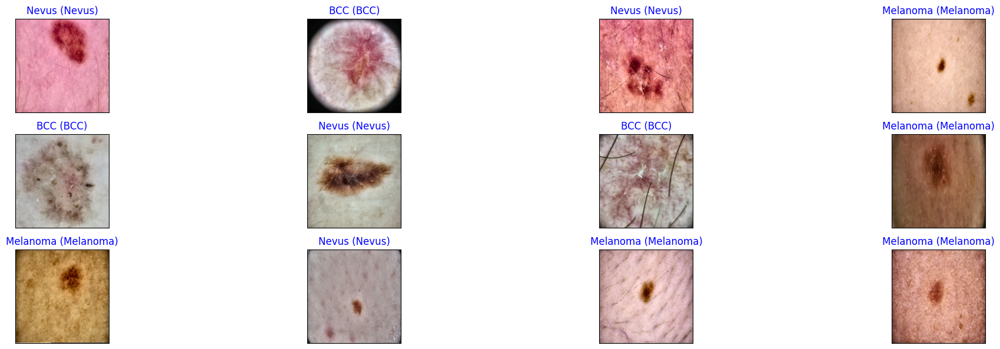

In [26]:
# Assume test_ds is defined and contains the test dataset as a tf.data.Dataset

y_hat = model.predict(test_ds) # Corrected variable name from ds_test to test_ds

# To plot, we need to extract images and true labels from the test_ds
# Note: This might load the entire test dataset into memory, which could be an issue for very large datasets.
# A more memory-efficient approach would involve iterating through the dataset.
# For plotting a sample, loading a subset might be acceptable.

# Extract images and labels from the test dataset for plotting
x_test_plot = []
y_test_plot = []
for images, labels in test_ds:
    x_test_plot.append(images.numpy())
    y_test_plot.append(labels.numpy())

# Concatenate the batches into a single numpy array
import numpy as np # Ensure numpy is imported
x_test_plot = np.concatenate(x_test_plot, axis=0)
y_test_plot = np.concatenate(y_test_plot, axis=0)

# define text labels
skin_labels = ['BCC','Melanoma','Nevus']

# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8)) # Ensure matplotlib.pyplot as plt is imported
for i, idx in enumerate(np.random.choice(x_test_plot.shape[0], size=12, replace=False)):
    ax = fig.add_subplot(4,4, i+1, xticks=[], yticks=[])
    # Images from tf.data.Dataset loaded as float32 in [0, 1], scale for display
    ax.imshow(np.squeeze(x_test_plot[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test_plot[idx]) # Use y_test_plot which comes from the dataset
    ax.set_title("{} ({})".format(skin_labels[pred_idx], skin_labels[true_idx]),
                 color=("blue" if pred_idx == true_idx else "orange"))

plt.tight_layout() # Add this for better spacing
plt.show() # Add this to display the plot

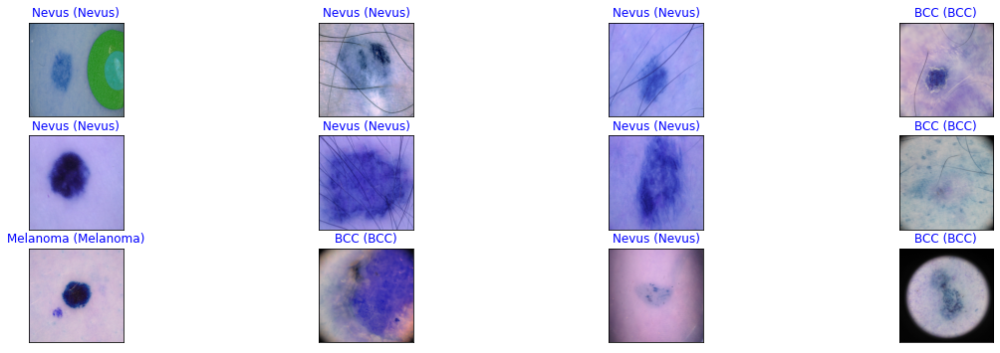

In [ ]:
y_hat = model.predict(x_test)

# define text labels
skin_labels = ['BCC','Melanoma','Nevus']

# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(20, 8))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size=12, replace=False)):
    ax = fig.add_subplot(4,4, i+1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[idx]))
    pred_idx = np.argmax(y_hat[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(skin_labels[pred_idx], skin_labels[true_idx]),
                 color=("blue" if pred_idx == true_idx else "orange"))

In [ ]:
from tensorflow.keras.preprocessing import image
img_path='/content/drive/MyDrive/skin_cancer_dataset/Melanoma/test/melanoma_ISIC_0000159.jpg'
img = Image.open(img_path).resize((224,224)) #target_size must agree with what the trained model expects!!

# Preprocessing the image
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img = img.astype('float32')/255